Q

* Train my XGBoost on 80% data (not too long?) Start soon!!!

# Imports

In [3]:
import pandas as pd
import numpy as np
from scipy import stats

 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
import xgboost as xgb
import sklearn.metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import permutation_test_score

from mpl_toolkits.basemap import Basemap
import hazelbean as hb

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option('display.max_columns', 500)



# Load dataset

## Load data

In [4]:
def load_data(subset=True):
    ''' subset takes values of : True/float/False
            True : (sampling of 2% by default)
            Float : Fraction to sample (e.g 0.10 for 10%)
            False : returns df, X_validation, y_validation
    '''
    
    #L.info('Loading data')
    crop_types_df = pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/aggregate_crops_by_type/aggregated_crop_data.csv')
    df_land = pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_baseline_regression_data/baseline_regression_data.csv')
    #L.info('Data loaded')

    df = crop_types_df.merge(df_land,how='outer',on='pixel_id')
    #L.info('Data merged')
    if subset==True:
        #subset = 0.02 if type(subset) is bool else subset
        df = df.sample(frac=0.02, replace=False, weights=None, random_state=None, axis=0)

    elif subset==False: #Save validation data
        x = df.drop(['calories_per_ha'], axis=1)
        y = df['calories_per_ha']
        X, X_validation, Y, y_validation = train_test_split(x, y)
        df = X.merge(pd.DataFrame(Y),how='outer',left_index=True,right_index=True)

    #Remove cal_per_ha per crop type for now
    df = df.drop(labels=['c3_annual_calories_per_ha', 'c3_perennial_calories_per_ha',
           'c4_annual_calories_per_ha', 'c4_perennial_calories_per_ha',
           'nitrogen_fixer_calories_per_ha'], axis=1)

    #Remove helper columns (not features)
    df = df.drop(labels=['Unnamed: 0', 'country_ids',
           'ha_per_cell_5m'], axis=1)

    # Rename cols
    df = df.rename(columns={'bio12': 'precip', 'bio1': 'temperature',
                                'minutes_to_market_5m': 'min_to_market',
                                'gdp_per_capita_2000_5m': 'gdp_per_capita',
                                'gdp_2000': 'gdp'})
    # Encode properly NaNs
    df['slope'] = df['slope'].replace({0: np.nan})  # 143 NaN in 'slope' variable
    for soil_var in ['workability_index', 'toxicity_index', 'rooting_conditions_index', 'oxygen_availability_index',
                     'nutrient_retention_index', 'nutrient_availability_index', 'excess_salts_index']:
        df[soil_var] = df[soil_var].replace({255: np.nan})
        
    # Drop NaN
    df = df.dropna()
    df = df[df['calories_per_ha'] != 0]    
    
    #Encode climate zones (as str)
    climate_zones_map = {1:'Af',2:'Am',3:'Aw',
                     5:'BWk',4:'BWh',7:'BSk',6:'BSh',
                     14:'Cfa',15:'Cfb',16:'Cfc',8:'Csa',
                     9:'Csb',10:'Csc',11:'Cwa',12:'Cwb',13:'Cwc',
                     25:'Dfa',26:'Dfb',27:'Dfc',28:'Dfd',17:'Dsa',18:'Dsb',19:'Dsc',
                     20:'Dsd',21:'Dwa',22:'Dwb',23:'Dwc',24:'Dwd',
                     30:'EF',29:'ET'}
    df['climate_zones'] = df['climate_zones'].map(climate_zones_map)
    
    # Encode climate zones as dummies
    climate_dummies_df = pd.get_dummies(df['climate_zones'])
    for col in climate_dummies_df.columns:
        climate_dummies_df = climate_dummies_df.rename({col:str('climatezone_'+col)},axis=1)
    
    df = df.merge(climate_dummies_df, right_index=True,left_index=True)
    df = df.drop('climate_zones',axis=1)
    
    # Lat/Lon
    df['sin_lon'] = df['lon'].apply(lambda x:np.sin(np.radians(x)))
    df['sin_lat'] = df['lat'].apply(lambda x:np.sin(np.radians(x)))
    
    # Log some skewed variables
    df['calories_per_ha'] = df['calories_per_ha'].apply(lambda x: np.log(x) if x != 0 else 0)

    for col in ['gdp_per_capita','altitude', 'min_to_market', 'gpw_population']:
        df[str('log_'+col)] = df[col].apply(lambda x: np.log(x) if x != 0 else 0)
        df = df.drop(col,axis=1)
        
    # Slope
    df['slope'] = df['slope'].apply(lambda x:x-90)
    
    # Encode properly NaNs
    df['slope'] = df['slope'].replace({0: np.nan})  # 143 NaN in 'slope' variable
    for soil_var in ['workability_index', 'toxicity_index', 'rooting_conditions_index', 'oxygen_availability_index',
                     'nutrient_retention_index', 'nutrient_availability_index', 'excess_salts_index']:
        df[soil_var] = df[soil_var].replace({255: np.nan})
        
        
            
    df = df.set_index('pixel_id')

    if subset==True:
        return df
    
    elif subset==False:
        return df, X_validation, y_validation

In [97]:
#df_full, X_validation, y_validation = load_data(subset=False)

In [5]:
df, X_validation, y_validation = load_data(subset=False)
len(df)

434733

In [3]:
df = load_data()
len(df) #11638

In [6]:
columns_without_climatezones = df.columns
for col in df.columns:
    if "climatezone" in col: 
        columns_without_climatezones = columns_without_climatezones.drop([col])

### Data for Louis

In [16]:
def data_for_Louis(subset=True):
    ''' subset takes values of : True/float/False
            True : (sampling of 2% by default)
            Float : Fraction to sample (e.g 0.10 for 10%)
            False : returns df, X_validation, y_validation
    '''
    
    #L.info('Loading data')
    crop_types_df = pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/aggregate_crops_by_type/aggregated_crop_data.csv')
    df_land = pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_baseline_regression_data/baseline_regression_data.csv')
    #L.info('Data loaded')

    df = crop_types_df.merge(df_land,how='outer',on='pixel_id')
    
    #Remove cal_per_ha per crop type for now
    df = df.drop(labels=['c3_annual_calories_per_ha', 'c3_perennial_calories_per_ha',
           'c4_annual_calories_per_ha', 'c4_perennial_calories_per_ha',
           'nitrogen_fixer_calories_per_ha'], axis=1)

    #Remove helper columns (not features)
 ##   df = df.drop(labels=['Unnamed: 0', 'country_ids',
 ##          'ha_per_cell_5m'], axis=1)

    # Rename cols
    df = df.rename(columns={'bio12': 'precip', 'bio1': 'temperature',
                                'minutes_to_market_5m': 'min_to_market',
                                'gdp_per_capita_2000_5m': 'gdp_per_capita',
                                'gdp_2000': 'gdp'})
    # Encode properly NaNs
 ##   df['slope'] = df['slope'].replace({0: np.nan})  # 143 NaN in 'slope' variable
 ##   for soil_var in ['workability_index', 'toxicity_index', 'rooting_conditions_index', 'oxygen_availability_index',
 ##                    'nutrient_retention_index', 'nutrient_availability_index', 'excess_salts_index']:
 ##       df[soil_var] = df[soil_var].replace({255: np.nan})
        
    # Drop NaN
##    df = df.dropna()
##    df = df[df['calories_per_ha'] != 0]    
    
    #Encode climate zones (as str)
    climate_zones_map = {1:'Af',2:'Am',3:'Aw',
                     5:'BWk',4:'BWh',7:'BSk',6:'BSh',
                     14:'Cfa',15:'Cfb',16:'Cfc',8:'Csa',
                     9:'Csb',10:'Csc',11:'Cwa',12:'Cwb',13:'Cwc',
                     25:'Dfa',26:'Dfb',27:'Dfc',28:'Dfd',17:'Dsa',18:'Dsb',19:'Dsc',
                     20:'Dsd',21:'Dwa',22:'Dwb',23:'Dwc',24:'Dwd',
                     30:'EF',29:'ET'}
    df['climate_zones'] = df['climate_zones'].map(climate_zones_map)
    
    # Encode climate zones as dummies
    climate_dummies_df = pd.get_dummies(df['climate_zones'])
    for col in climate_dummies_df.columns:
        climate_dummies_df = climate_dummies_df.rename({col:str('climatezone_'+col)},axis=1)
    
    df = df.merge(climate_dummies_df, right_index=True,left_index=True)
    
    return df
##    df = df.drop('climate_zones',axis=1)
    
    # Lat/Lon
##    df['sin_lon'] = df['lon'].apply(lambda x:np.sin(np.radians(x)))
##    df['sin_lat'] = df['lat'].apply(lambda x:np.sin(np.radians(x)))
    
    # Log some skewed variables
##    df['calories_per_ha'] = df['calories_per_ha'].apply(lambda x: np.log(x) if x != 0 else 0)

##    for col in ['gdp_per_capita','altitude', 'min_to_market', 'gpw_population']:
##        df[str('log_'+col)] = df[col].apply(lambda x: np.log(x) if x != 0 else 0)

    # Slope
##    df['slope'] = df['slope'].apply(lambda x:x-90)
    
    # Encode properly NaNs
##    df['slope'] = df['slope'].replace({0: np.nan})  # 143 NaN in 'slope' variable
##    for soil_var in ['workability_index', 'toxicity_index', 'rooting_conditions_index', 'oxygen_availability_index',
##                     'nutrient_retention_index', 'nutrient_availability_index', 'excess_salts_index']:
##        df[soil_var] = df[soil_var].replace({255: np.nan})
        
        
            
##    df = df.set_index('pixel_id')

##    if subset==True:
##        return df
##    
##   elif subset==False:
##        return df, X_validation, y_validation

## Explore data

### Visualize input features

In [9]:
len(df_land)

3077045

In [8]:
df_land.columns

Index(['Unnamed: 0', 'country_ids', 'ha_per_cell_5m', 'slope', 'altitude',
       'workability_index', 'toxicity_index', 'rooting_conditions_index',
       'protected_areas_index', 'oxygen_availability_index',
       'nutrient_retention_index', 'nutrient_availability_index',
       'excess_salts_index', 'gdp_2000', 'gdp_per_capita_2000_5m',
       'minutes_to_market_5m', 'gpw_population', 'climate_zones', 'temp_avg',
       'temp_diurnalrange', 'temp_isothermality', 'temp_seasonality',
       'temp_annualmax', 'temp_annualmin', 'temp_annualrange', 'precip',
       'precip_wet_mth', 'precip_dry_mth', 'precip_seasonality', 'pixel_id',
       'pixel_id_float', 'land_mask', 'lon', 'lat'],
      dtype='object')

In [11]:
cols_features = ['slope', 'altitude',
       'workability_index', 'toxicity_index', 'rooting_conditions_index',
       'protected_areas_index', 'oxygen_availability_index',
       'nutrient_retention_index', 'nutrient_availability_index',
       'excess_salts_index', 'gdp_2000', 'gdp_per_capita_2000_5m',
       'minutes_to_market_5m', 'gpw_population', 'climate_zones', 'temp_avg',
       'temp_diurnalrange', 'temp_isothermality', 'temp_seasonality',
       'temp_annualmax', 'temp_annualmin', 'temp_annualrange', 'precip',
       'precip_wet_mth', 'precip_dry_mth', 'precip_seasonality', 'lon', 'lat','sin_lon','sin_lat']

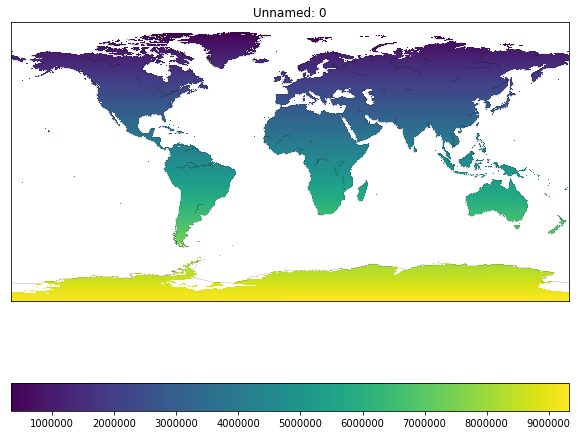

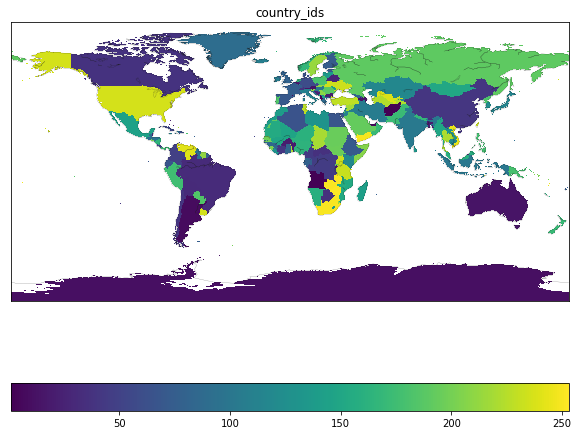

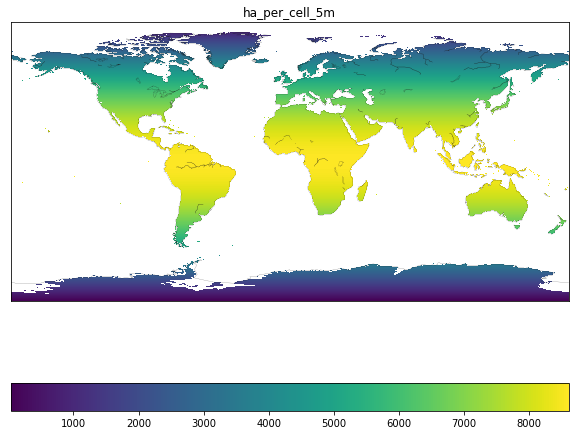

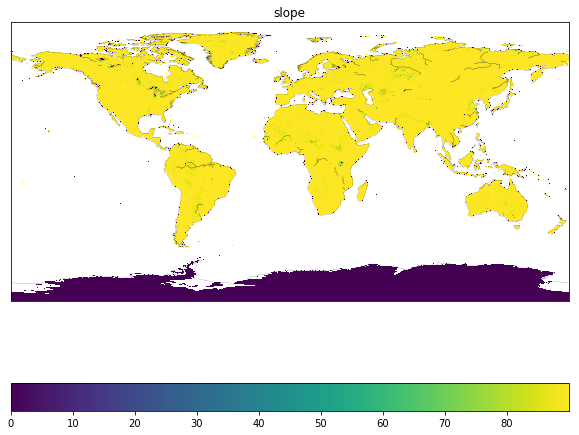

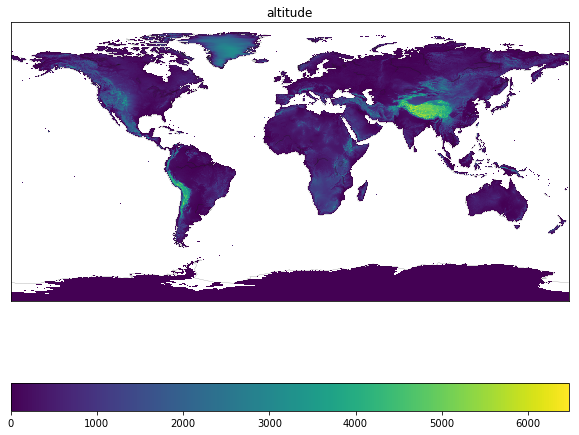

...

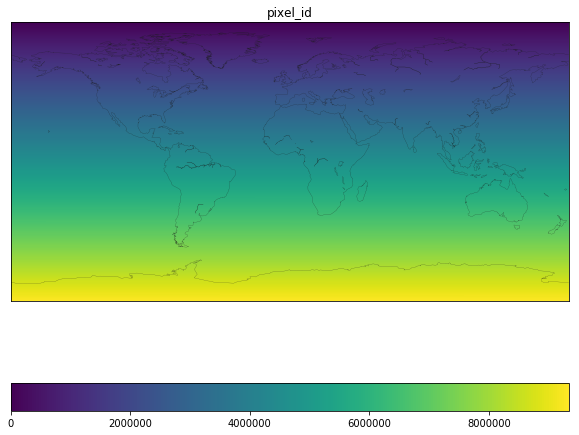

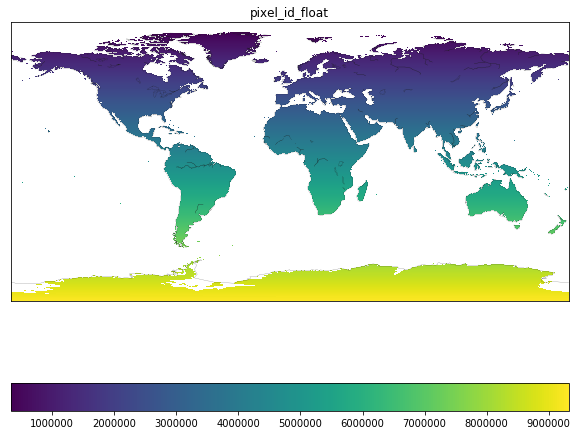

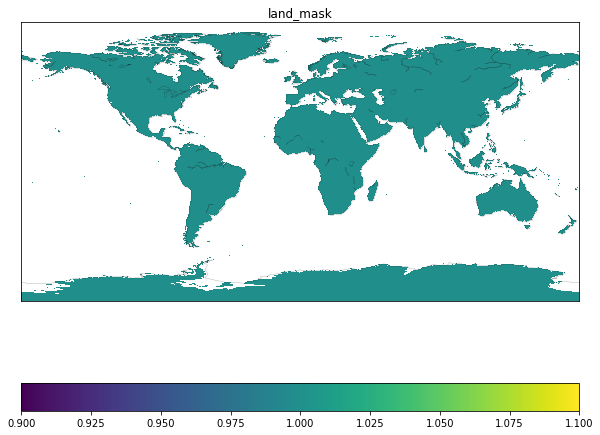

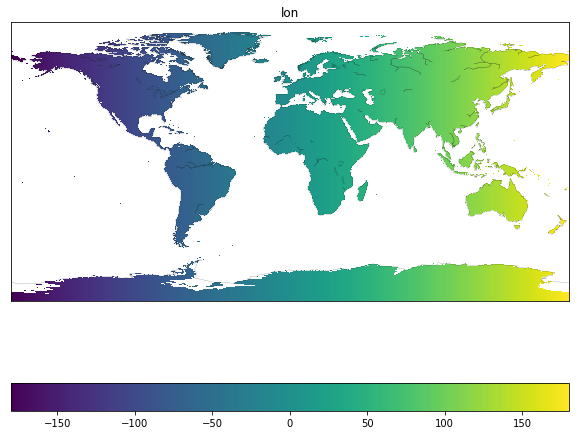

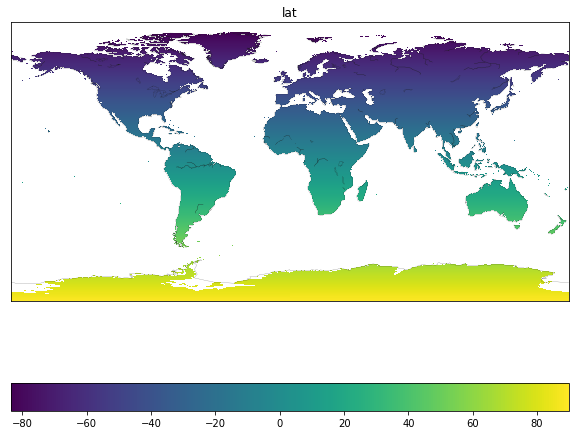

In [29]:
baseline_regression_data_path = '../ipbes_invest_crop_yield_project/intermediate/create_baseline_regression_data/baseline_regression_data.csv'
country_ids_raster_path = '../ipbes_invest_crop_yield_project/input/Cartographic/country_ids.tif'

df_land = pd.read_csv(baseline_regression_data_path)

for col in df_land.columns:
    fig,axes = plt.subplots(1, 1, figsize=(10,10))
    visualize_data(col)
    plt.show()


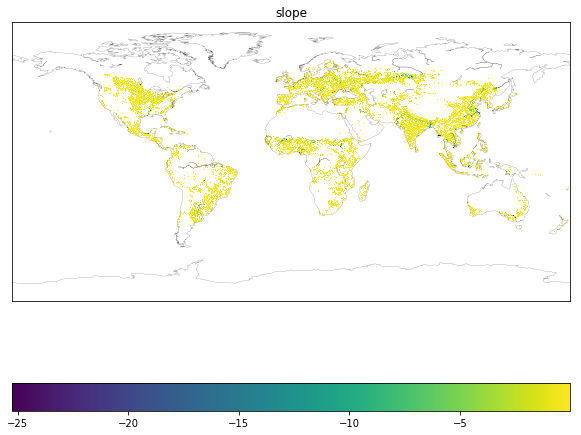

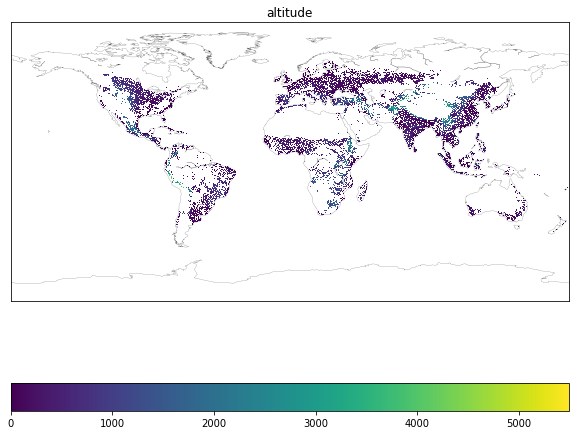

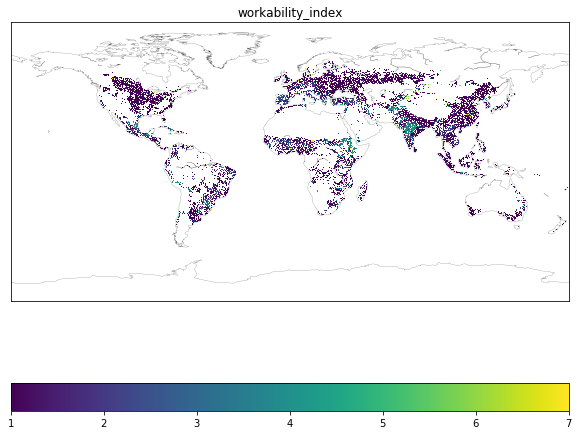

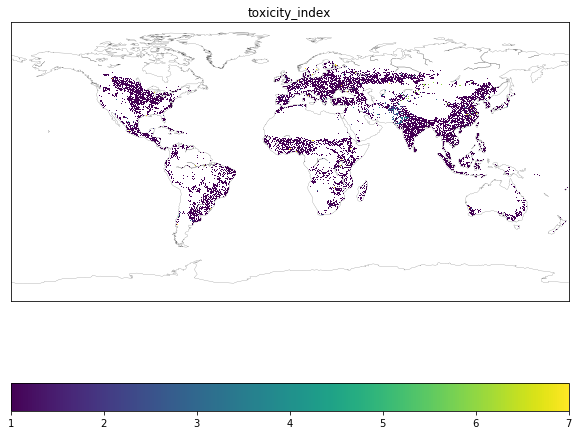

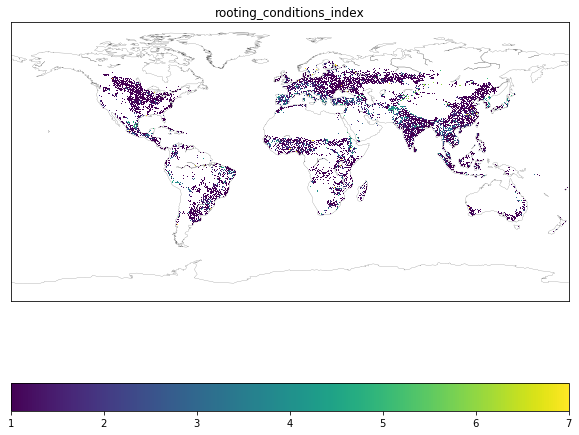

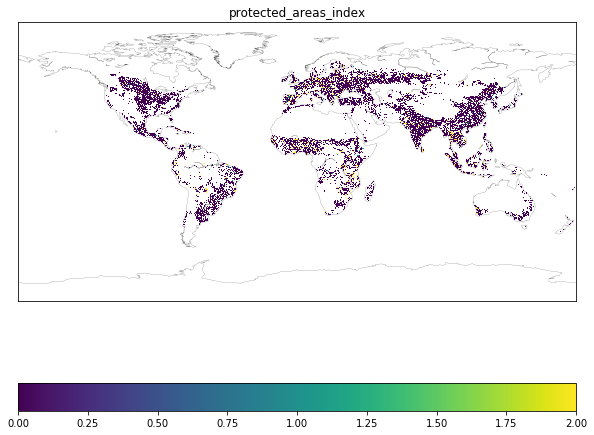

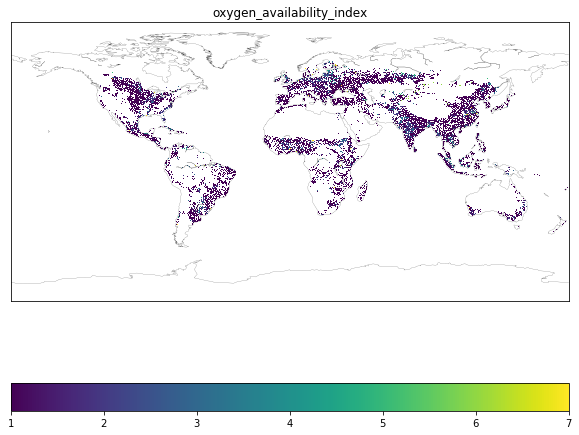

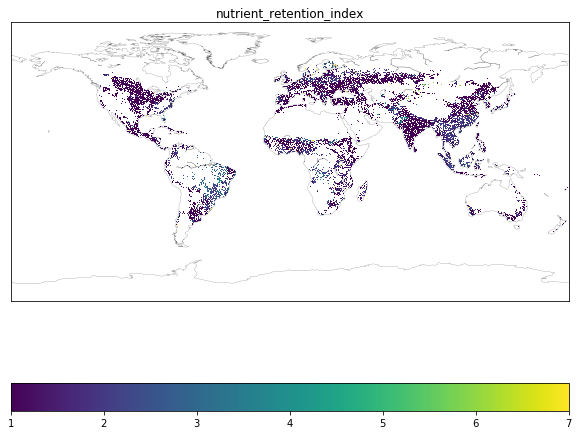

In [ ]:
## Latest baseline_df

country_ids_raster_path = '../ipbes_invest_crop_yield_project/input/Cartographic/country_ids.tif'

for col in df.columns:
    fig,axes = plt.subplots(1, 1, figsize=(10,10))
    visualize_data(col,DF=df.reset_index())
    plt.show()


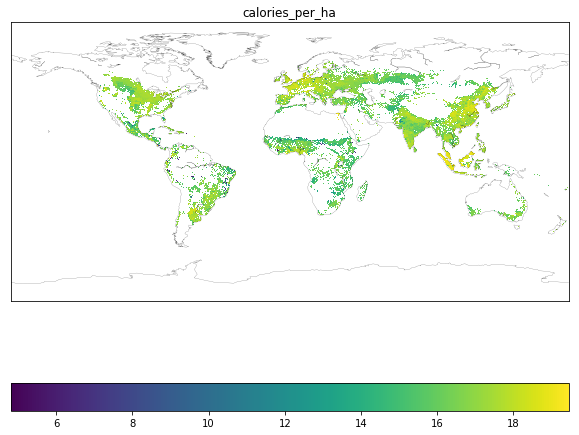

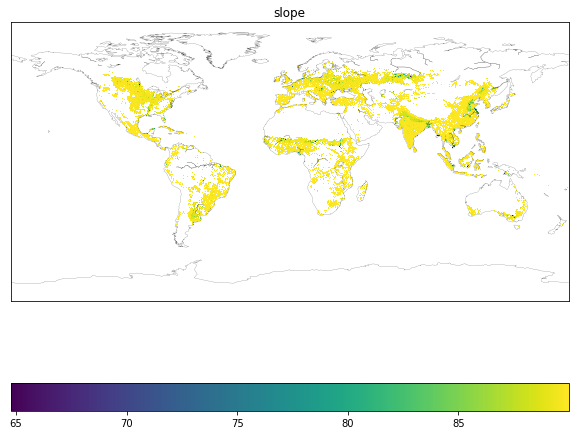

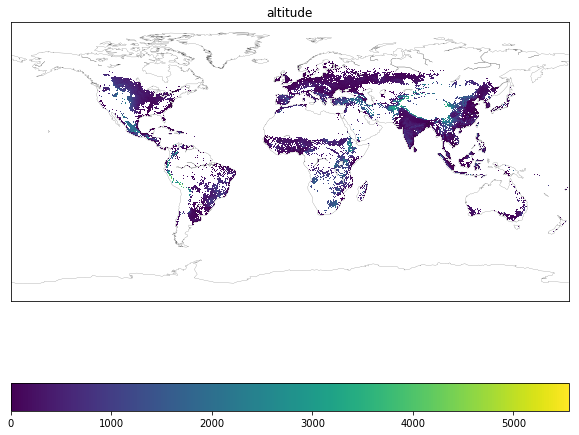

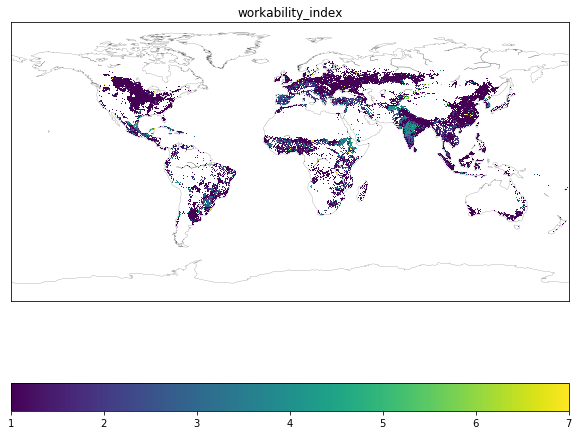

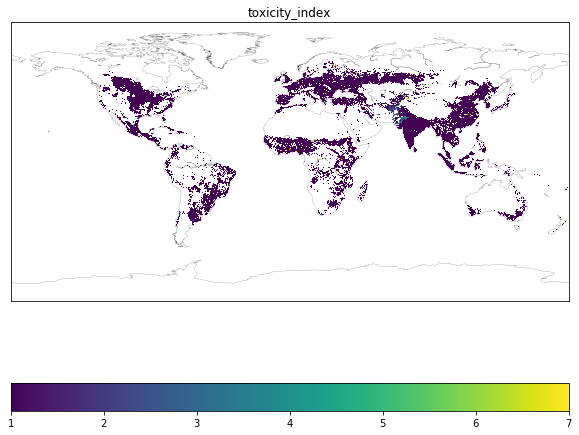

...

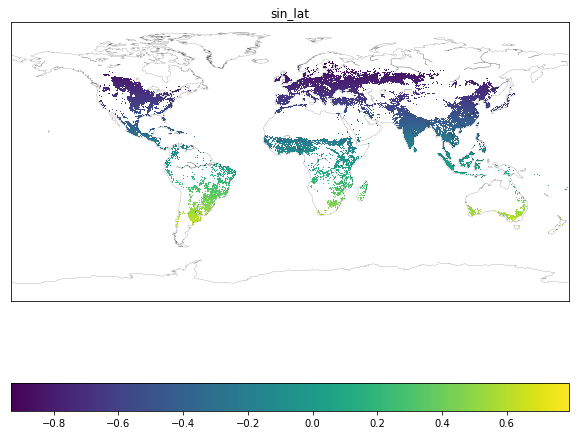

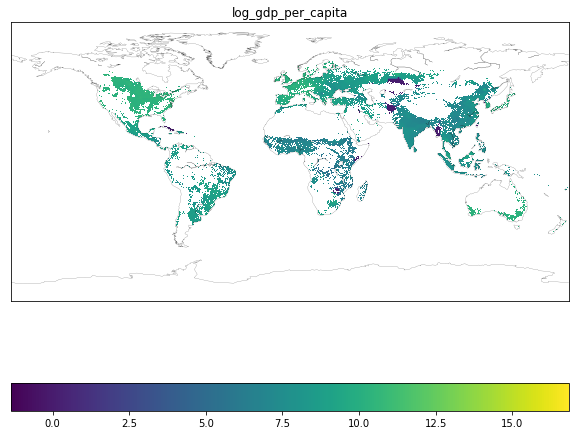

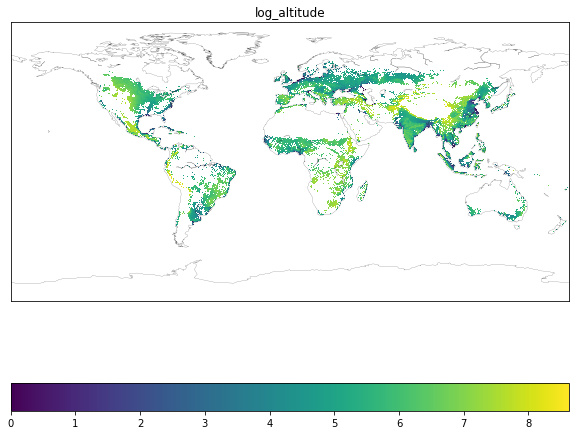

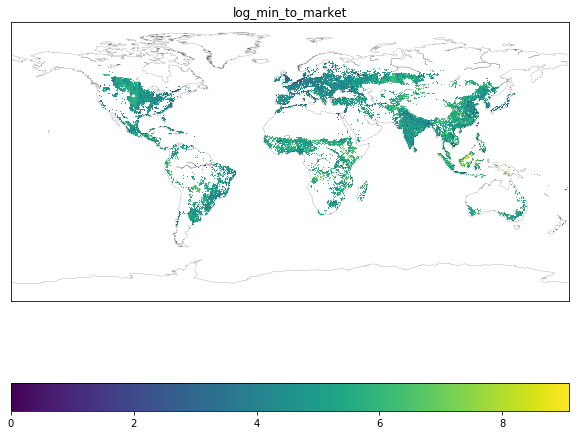

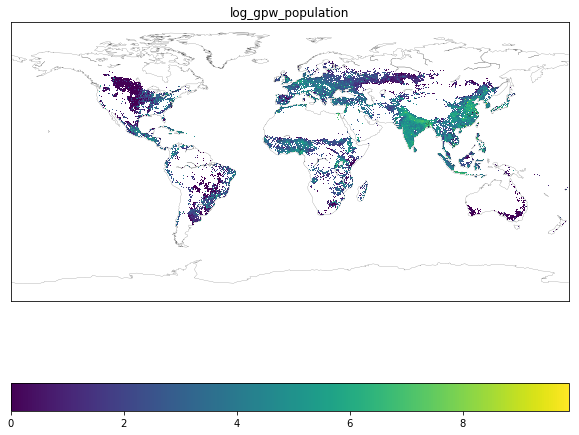

In [100]:
## Old baseline_df

for col in df.columns:
    fig,axes = plt.subplots(1, 1, figsize=(10,10))
    visualize_data(col,DF=df.reset_index())
    plt.show()


### Look at distributions

# Results

## What's a significant R2?

### permutation_test_score

Returns:
* score : The true score without permuting targets.

* permutation_scores : The scores obtained for each permutations.

* pvalue :  approximates the probability that the score would be obtained by chance. This is calculated as: (C + 1) / (n_permutations + 1) where C is the number of permutations whose score >= the true score. The best possible p-value is 1/(n_permutations + 1), the worst is 1.0.

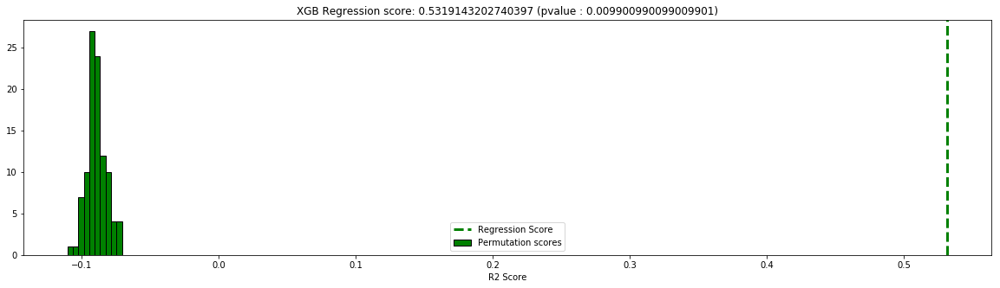

In [55]:
# #############################################################################
# View histogram of permutation scores
Fig, ax = plt.subplots(figsize=(20,5))
plt.hist(permutation_scores, 10, label='Permutation scores',
         edgecolor='black',color='green')
ylim = plt.ylim()
# BUG: vlines(..., linestyle='--') fails on older versions of matplotlib
# plt.vlines(score, ylim[0], ylim[1], linestyle='--',
#          color='g', linewidth=3, label='Classification Score'
#          ' (pvalue %s)' % pvalue)
# plt.vlines(1.0 / n_classes, ylim[0], ylim[1], linestyle='--',
#          color='k', linewidth=3, label='Luck')
plt.plot(2 * [score], ylim, '--g', linewidth=3,
         label='Regression Score')
#plt.plot(2 * [1. / n_classes], ylim, '--k', linewidth=3, label='Luck')

plt.ylim(ylim)
plt.legend()
plt.xlabel('R2 Score')
plt.title("XGB Regression score: %s (pvalue : %s)" % (score, pvalue))
plt.show()

In [50]:
xgbreg = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.75, gamma=0, learning_rate=0.03,
       max_delta_step=0, max_depth=7, min_child_weight=4, missing=None,
       n_estimators=600, n_jobs=1, nthread=4, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=1, subsample=0.75)

dataframe = df

x = dataframe.drop(['calories_per_ha'], axis=1)
y = dataframe['calories_per_ha']
X_train, X_test, y_train, y_test = train_test_split(x, y)

xgbreg.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.75, gamma=0, learning_rate=0.03,
       max_delta_step=0, max_depth=7, min_child_weight=4, missing=None,
       n_estimators=600, n_jobs=1, nthread=4, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=1, subsample=0.75)

In [51]:
## Takes about 10-15min ith 50 permutations. To do with more.

score, permutation_scores, pvalue = permutation_test_score(xgbreg,
                                                           X_train, y_train,
                                                           scoring=None, #Default for xgbRegessor is R2?
                                                           cv=None, # default 3 cvs
                                                           n_permutations=100,
                                                           n_jobs=6)

In [52]:
score

0.5319143202740397

In [53]:
permutation_scores

array([-0.08352248, -0.0808695 , -0.07069791, -0.09286762, -0.09578762,
       -0.0946268 , -0.09308895, -0.08380866, -0.09437852, -0.09304812,
       -0.0889394 , -0.09956592, -0.08287766, -0.08764317, -0.10121322,
       -0.09230398, -0.07855454, -0.08029531, -0.09466583, -0.07128202,
       -0.08458803, -0.09252021, -0.09137478, -0.0996977 , -0.09892042,
       -0.08269202, -0.08441134, -0.0821711 , -0.0840334 , -0.08746792,
       -0.08387149, -0.09125067, -0.0889178 , -0.09276241, -0.09480884,
       -0.0893635 , -0.09068265, -0.08113962, -0.07448759, -0.09820221,
       -0.09682301, -0.08504498, -0.09922708, -0.09055052, -0.08769439,
       -0.0956381 , -0.09345384, -0.09802236, -0.09177172, -0.09492718,
       -0.08527428, -0.09601336, -0.08897045, -0.09088448, -0.0929068 ,
       -0.0888605 , -0.10291756, -0.08786371, -0.09099712, -0.1008772 ,
       -0.09267596, -0.07159559, -0.07783692, -0.08896142, -0.09358995,
       -0.07614365, -0.09060869, -0.0891237 , -0.0917698 , -0.08

In [54]:
pvalue

0.009900990099009901

## Compare results

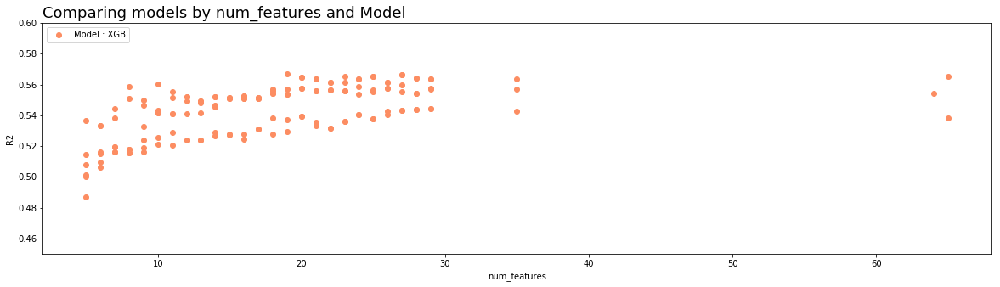

In [105]:
results_linear_1 =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_1    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv')
results_xgb_2    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug11.csv') 
results_xgb_bestparams3    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_bestparams3.csv')    
results_xgb_bestparams2    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_bestparams2.csv')

results_all = pd.concat([results_xgb_1,results_xgb_2,results_xgb_bestparams2,results_xgb_bestparams3]) 

plot_R2_2params('num_features','Model',results_all, scatter=True,ylim=(0.45,0.6))


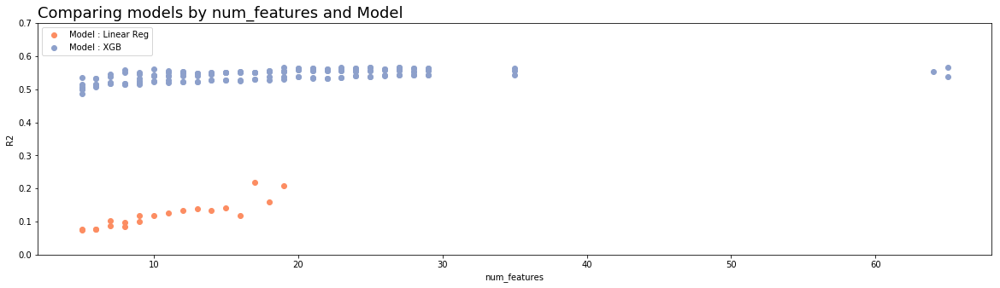

In [102]:
results_linear_1 =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_1    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv')
results_xgb_2    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug11.csv') 
results_xgb_bestparams3    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_bestparams3.csv')    
results_xgb_bestparams2    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_bestparams2.csv')

results_all = pd.concat([results_linear_1,results_xgb_1,results_xgb_2,results_xgb_bestparams2,results_xgb_bestparams3]) 

plot_R2_2params('num_features','Model',results_all, scatter=True,ylim=(0,0.7))


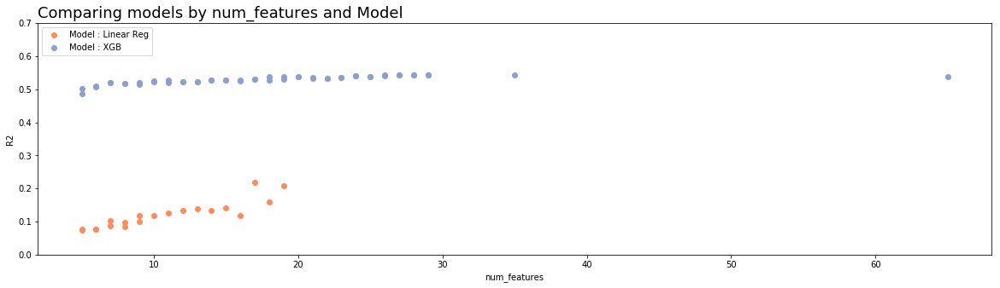

In [44]:
results_linear_1 =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_1    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv')
results_xgb_2    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug11.csv') 

results_all = pd.concat([results_linear_1,results_xgb_1,results_xgb_2]) 

plot_R2_2params('num_features','Model',results_all, scatter=True,ylim=(0,0.7))


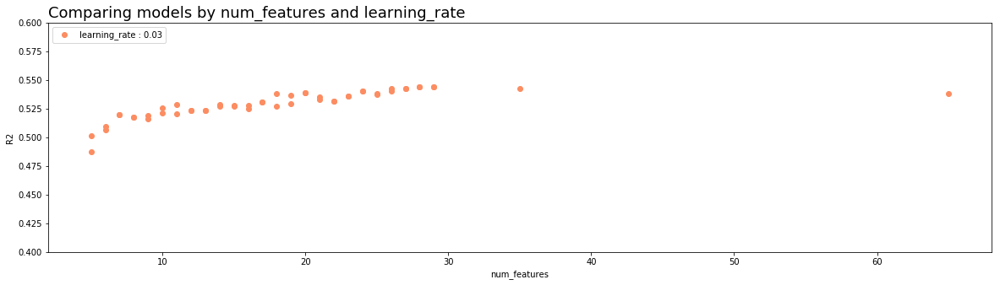

In [45]:
results_linear_1 =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_1    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv')
results_xgb_2    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug11.csv') 

results_all = pd.concat([results_linear_1,results_xgb_1,results_xgb_2]) 

plot_R2_2params('num_features','learning_rate',results_xgb_2, scatter=True,ylim=(0.4,0.6))


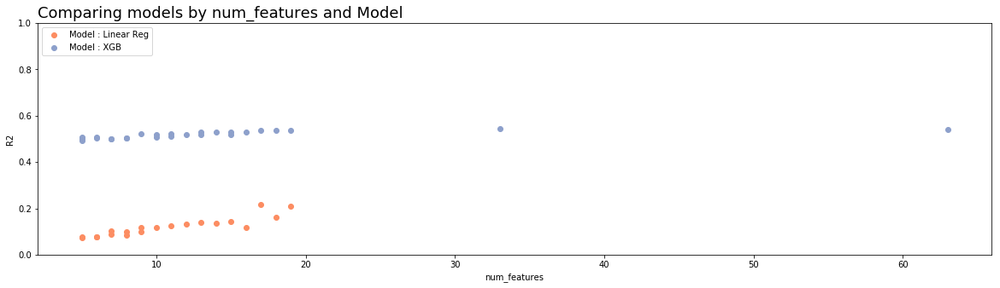

In [32]:
results_linear_1 =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_0    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv')
results_xgb_1    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug9.csv')
                 
results_all = pd.concat([results_linear_1,results_xgb_1])                 
                 
plot_R2_2params('num_features','Model',results_all, scatter=True,ylim=(0,1))

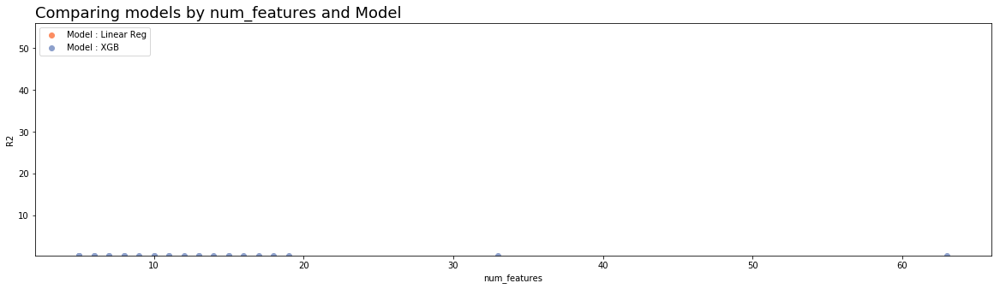

In [33]:
results_linear_1 =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_0    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv')
results_xgb_1    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug9.csv')
                 
results_all = pd.concat([results_linear_1,results_xgb_1])                 
                 
plot_R2_2params('num_features','Model',results_all, scatter=True,ylim=(0.4t((((((((((((((((((((((((((((((((((((((((((((((((((((((((,56))

### Alice : show std on this plot
### Is xgb determinist? Sinon faire 100x

In [ ]:
print("XGB Regression score %s (pvalue : %s)" % (score, pvalue))

# #############################################################################
# View histogram of permutation scores
plt.hist(permutation_scores, 20, label='Permutation scores',
         edgecolor='black')
ylim = plt.ylim()
# BUG: vlines(..., linestyle='--') fails on older versions of matplotlib
# plt.vlines(score, ylim[0], ylim[1], linestyle='--',
#          color='g', linewidth=3, label='Classification Score'
#          ' (pvalue %s)' % pvalue)
# plt.vlines(1.0 / n_classes, ylim[0], ylim[1], linestyle='--',
#          color='k', linewidth=3, label='Luck')
plt.plot(2 * [score], ylim, '--g', linewidth=3,
         label='Regression Score'
         ' (pvalue %s)' % pvalue)
plt.plot(2 * [1. / n_classes], ylim, '--k', linewidth=3, label='Luck')

plt.ylim(ylim)
plt.legend()
plt.xlabel('Score')
plt.show()

In [ ]:
score, permutation_scores, pvalue = permutation_test_score(xgbreg,
                                                           X_train, y_train,
                                                           scoring=None, #Default for xgbRegessor is R2?
                                                           cv=None, # default 3 cvs
                                                           n_permutations=50,
                                                           n_jobs=6)

In [ ]:
score

In [ ]:
permutation_scores

In [ ]:
pvalue

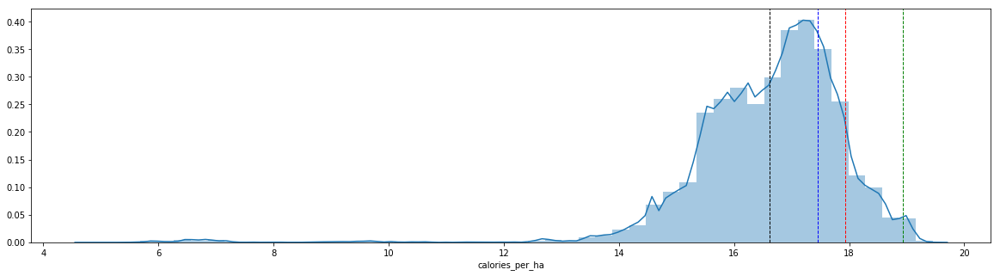

In [99]:
fig,ax = plt.subplots(figsize=(20,5));
sns.distplot(df[df['calories_per_ha']!=0]['calories_per_ha'],ax=ax);

#Lines at mean, 75%, 90%, and 99%
plt.axvline(df['calories_per_ha'].mean(), color='k', linestyle='dashed', linewidth=1);
plt.axvline(df['calories_per_ha'].quantile(0.75), color='b', linestyle='dashed', linewidth=1);
plt.axvline(df['calories_per_ha'].quantile(0.9), color='r', linestyle='dashed', linewidth=1);
plt.axvline(df['calories_per_ha'].quantile(0.99), color='g', linestyle='dashed', linewidth=1);

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


LinAlgError: singular matrix

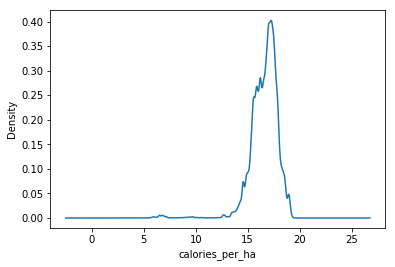

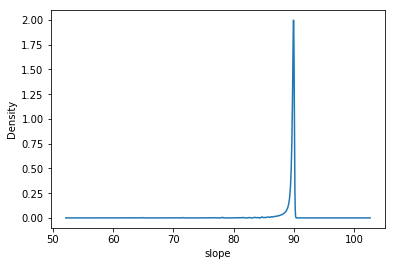

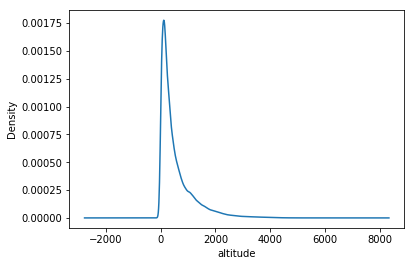

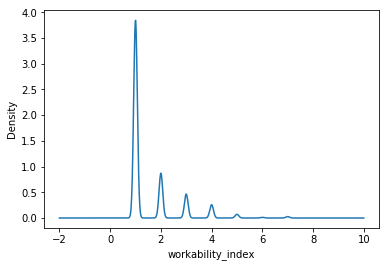

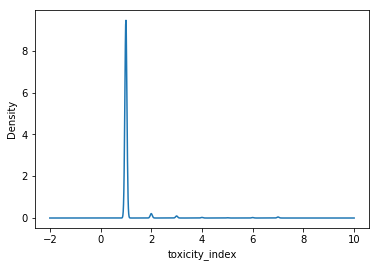

...

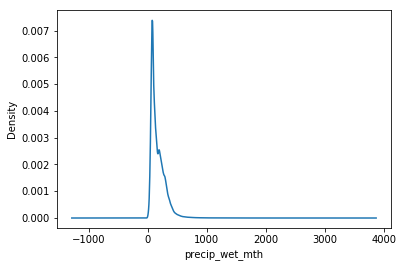

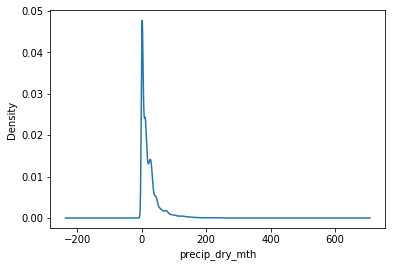

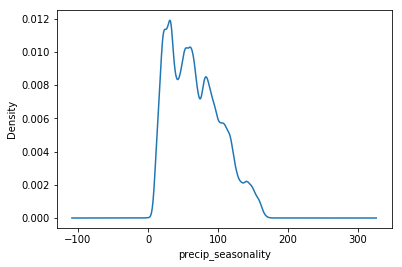

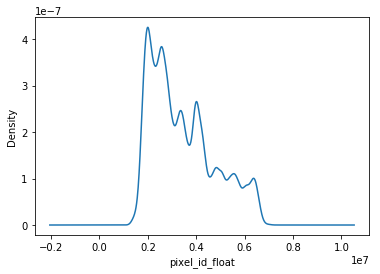

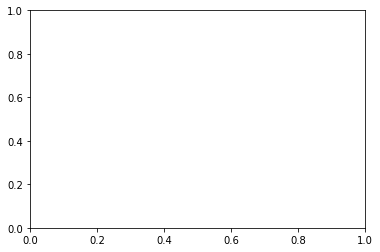

In [98]:
for var in df.columns:
    fig,ax = plt.subplots()
    df[var].plot(kind='kde',ax=ax);
    ax.set_xlabel(var);

# Utilities functions (make reg, store results, viz)

## Functions to make regressions

In [7]:
def do_regression(regression,dataframe):
    ##Must make dummies for categorical variable climate_zone
    # dataframe = pd.get_dummies(dataframe, columns=['climate_zone'])
    # Or just drop column if don't want dummies: x = x.drop(['climate_zone'], axis=1)

    x = dataframe.drop(['calories_per_ha'], axis=1)
    y = dataframe['calories_per_ha']

    ### Cross validation scores
    r2_scores = cross_val_score(regression, x, y, cv=5,scoring='r2')
    mse_scores = cross_val_score(regression, x, y, cv=5, scoring='neg_mean_squared_error')
    mae_scores = 0 #cross_val_score(regression, x, y, cv=5, scoring='neg_mean_absolute_error')
    
    return [np.mean(r2_scores),np.mean(mse_scores),np.mean(mae_scores)]

In [8]:
def compare_predictions(regression,dataframe,show_df=True,show_plot=True):
    x = dataframe.drop(['calories_per_ha','climate_zones'], axis=1)
    y = dataframe['calories_per_ha']
    X_train, X_test, y_train, y_test = train_test_split(x, y)

    reg = regression.fit(X_train, y_train)
    y_predicted = reg.predict(X_test)

    compare = pd.DataFrame()
    compare['y_test'] = y_test
    compare['predicted'] = y_predicted

    if show_plot == True:
        ax = compare.plot.scatter(x='y_test',y='predicted',s=0.5)
        ax.plot(ax.get_xlim(), ax.get_xlim(), ls="--", c=".3")
        
    return compare

In [9]:
def run_regressions_and_save_results(model, regression, dataframe, features_selection, results_df):
    '''features_selection = 'all', 'all_but_climzones', 'RFE', 'RFE_but_climzones   '''

    # - - - - - - - - - - - - - - 
    # Features = All
    # - - - - - - - - - - - - - - 
    
    if features_selection == 'all':
        print('    with all features...')
        Features = 'All w/ climzones'
        
        scores = do_regression(regression,dataframe)
        
        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        R2_score = scores[0]
        MSE_score = scores[1]
        results_df = results_df.append({'Model': model,
                                        'num_features':len(dataframe.columns)-1,'Features':Features,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)
        
        
    # - - - - - - - - - - - - - - -
    # Features = All but climzones
    # - - - - - - - - - - - - - - -
    
    elif features_selection == 'all_but_climzones':
        dataframe = dataframe[columns_without_climatezones]
        
        print('    with all features but climate zones...')
        Features = 'All w/o climzones'
        
        scores = do_regression(regression,dataframe)
        
        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        R2_score = scores[0]
        MSE_score = scores[1]
        results_df = results_df.append({'Model': model,
                                        'num_features':len(dataframe.columns)-1,'Features':Features,
                                    'R2':R2_score,'MSE':MSE_score},ignore_index=True)
           
    
    # - - - - - - - - - - - - - - -
    # Features = SUBSET
    # - - - - - - - - - - - - - - -
    
    # if features_selection = 'subset':
    ## TODO
    
    
    # - - - - - - - - - - - - - - - - - - - - - - -
    # Features = RFE selected (with climate zones)
    # - - - - - - - - - - - - - - - - - - - - - - -
    
    elif features_selection == 'RFE':
        for num_features in range (5,30):

            print(' RFE with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)
            x = dataframe.drop(['calories_per_ha'], axis=1) 
            y = dataframe['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)
            X_RFE = selector.fit_transform(X,Y)
            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
            
            # Do regression and append results to results_df
            scores = do_regression(regression,dataframe[(features_selected + ['calories_per_ha'])])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
            R2_score = scores[0]
            MSE_score = scores[1]
            results_df = results_df.append({'Model': model,
                                    'num_features':num_features,'Features':features_selected,
                                    'R2':R2_score,'MSE':MSE_score},ignore_index=True)
        
        
    # - - - - - - - - - - - - - - - - - - - - - - 
    # Features = RFE selected (w/o climate zones)
    # - - - - - - - - - - - - - - - - - - - - - - 
    
    elif features_selection == 'RFE_but_climzones':
        
        dataframe = dataframe[columns_without_climatezones]
        
        for num_features in range (5,30):

            print('RFE (no climzones) with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)
            x = dataframe.drop(['calories_per_ha'], axis=1) 
            y = dataframe['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)
            X_RFE = selector.fit_transform(X,Y)
            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
   
            # Do regression and append results to results_df
            scores = do_regression(regression,dataframe[(features_selected + ['calories_per_ha'])])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
            R2_score = scores[0]
            MSE_score = scores[1]
            results_df = results_df.append({'Model': model,
                                    'num_features':num_features,'Features':features_selected,
                                    'R2':R2_score,'MSE':MSE_score},ignore_index=True)
    
        
    return(results_df)

## Viz functions

In [16]:
## Geographical data

def plot_col(df, col_name, shape=(2160, 4320)):
    m = np.array(df[col_name])
    bm = Basemap()
    im = bm.imshow(np.flipud(m.reshape(shape)))
    bm.drawcoastlines(linewidth=0.15, color='0.1')
    cbar = plt.colorbar(im, orientation='horizontal')
    plt.title(col_name)
    plt.show()

df_land=pd.DataFrame()
def visualize_data(col_name,DF=df_land):

    match_af = hb.ArrayFrame(country_ids_raster_path)
    zeros_array = np.zeros(match_af.size)
    zeros_df = pd.DataFrame(zeros_array)
    
    ### ??? agg_df = pd.merge(zeros_df, df_land, left_index=True, right_on='pixel_id', how='outer')
    full_df = pd.merge(zeros_df, DF, left_index=True, right_on='pixel_id', how='outer')
        
        

    plot_col(full_df, col_name)

In [15]:
## Compare models by R2 scores

def plot_R2_2params(param_x, param_color, xgb_tuning,scatter=False,ylim=None):

    fig, ax = plt.subplots(figsize=(20,5))


    palette = plt.get_cmap('Set2')
    num=0
    for param_color_value in xgb_tuning[param_color].unique():
        num+=1
        x = (xgb_tuning[xgb_tuning[param_color]==param_color_value][param_x])
        y = (xgb_tuning[xgb_tuning[param_color]==param_color_value]['R2'])
        #labels= (xgb_tuning[xgb_tuning[param_color]==learning_rate][param_color])
        if scatter == False:
            P = plt.plot(x,y, marker='.',color=palette(num), linewidth=2, alpha=0.9,
                 label=(str(param_color)+' : ' +str(param_color_value)))
        if scatter == True:
            P = plt.scatter(x,y, marker='o',color=palette(num),
                 label=(str(param_color)+' : ' +str(param_color_value)))
        
    plt.legend(loc=2, ncol=1)
    plt.title(("Comparing models by "+ param_x +" and "+param_color), loc='left', fontsize=18, fontweight=0, color='black')

    plt.xlabel(param_x)
    plt.ylabel("R2")
    
    # Y lim
    if ylim != None:
        if scatter == False:
            P[0].axes.set_ylim(ylim)
        if scatter == True:
            P.axes.set_ylim(ylim)

# Modeling

In [22]:
Observer resultats pour : 
('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_linear.csv') 
('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_Lasso.csv') 
('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_Rigde.csv')

## Linear regression

In [23]:
results_final_Linear = pd.DataFrame(columns=['Model','num_features','Features','MSE','R2'])

model = 'linear'
lr = LinearRegression()

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results = run_regressions_and_save_results(model, lr, df, features_selection, results_final_Linear)
    
results.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_linear.csv')    

    with all features...
    R2_score : 0.31043357439279573
    MSE_score : -1.2719582154502775
    with all features but climate zones...
    R2_score : 0.2896881630914779
    MSE_score : -1.3102403058464391
 RFE with 5 features ...
    R2_score : 0.07963453210128783
    MSE_score : -1.6976035830217377
 RFE with 6 features ...
    R2_score : 0.08956736737011603
    MSE_score : -1.6792982741737732
 RFE with 7 features ...
    R2_score : 0.09161433243484725
    MSE_score : -1.6755207566458652
 RFE with 8 features ...
    R2_score : 0.106983892062458
    MSE_score : -1.6471817006182292
 RFE with 9 features ...
    R2_score : 0.14106983748454324
    MSE_score : -1.58430687853798
 RFE with 10 features ...
    R2_score : 0.14117244779473498
    MSE_score : -1.5841163659010555
 RFE with 11 features ...
    R2_score : 0.14880804241939619
    MSE_score : -1.5700318118857806
 RFE with 12 features ...
    R2_score : 0.14901094848790167
    MSE_score : -1.5696566858017635
 RFE with 13 features ..

In [44]:
### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
### - - - - - - - - - - - - - - - -  Linear regression - - - - - - - - - - - - - - - - 
### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -


regression = LinearRegression()

model = 'Linear Reg'

dataframe = df
        

# Iterate over ≠ numbers of features
for num_features in range (5,40):

    ## RFE - Features selection
    selector = RFE(regression, num_features, step=1)

    x = dataframe.drop(['calories_per_ha'], axis=1) 
    y = dataframe['calories_per_ha']
    X, X_test, Y, Y_test = train_test_split(x, y)

    X_RFE = selector.fit_transform(X,Y)

    features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
    features_selected.append('calories_per_ha')
    scores = do_regression(regression,dataframe[features_selected])
    R2_score = scores[0]
    MSE_score = scores[1]
    MAE_score = scores[2]

    results = results.append({'Model': model,
                              'num_features':num_features,
                              'Features':features_selected,
                              'R2':R2_score,
                              'MSE':MSE_score},
                             ignore_index=True)
    

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):
/Users/charlotteweil1/anaconda/

## Polynomial regression (TODO)

### Polynomial features

In [10]:
def make_polynomial(df, degree = 2, interaction_terms = True):
#'''Returns a new dataFrame with added polynomial terms degree >= 2'''


    if interaction_terms == False:
        x = df.drop(['calories_per_ha'], axis=1)
        y = df['calories_per_ha']

        for deg in range(2,degree+1):
            for col in x.columns:
                x[str(col+'^'+str(deg))] = x[col].apply(lambda x:x**deg)
        
        Poly_df = x.merge(pd.DataFrame(y),right_index=True,left_index=True)

    if interaction_terms == True:
        x = df.drop(['calories_per_ha'], axis=1)
        y = df['calories_per_ha'].reset_index()

        poly = PolynomialFeatures(degree=degree, include_bias=False)
        X2 = poly.fit_transform(x)

        Poly_df = pd.DataFrame(data = np.concatenate((y.as_matrix(),X2),axis=1),
                               columns = ['pixel_id','calories_per_ha'] +
                               poly.get_feature_names((df.drop(['calories_per_ha'], axis=1)).columns))

        Poly_df = Poly_df.set_index('pixel_id')

    return Poly_df


### Do regression (to fix TODO!)

In [ ]:
results_final_Poly = pd.DataFrame(columns=['Model','num_features','Features','MSE','R2'])


reg = LinearRegression()

degree = 2
for interaction_terms in [False,True]:
    print('Running Polynomial of degree ' + str(degree)+ interaction_terms*(' with interaction terms'))
    model = str('Poly deg'+str(degree)+interaction_terms*' w/ interact')

    dataframe = make_polynomial(df,degree,interaction_terms)

    for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
        results = run_regressions_and_save_results(model, reg, df, features_selection, results_final_Poly)
        
degree = 3
print('Running Polynomial of degree ' + str(degree)+ interaction_terms*(' with interaction terms'))
model = str('Poly deg'+str(degree))

dataframe = make_polynomial(df,degree,interaction_terms)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results = run_regressions_and_save_results(model, reg, df, features_selection, results_final_Poly)

results.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_Poly.csv') 

Running Polynomial of degree 2
    with all features...
    R2_score : 0.30982238129045525
    MSE_score : -1.266374414767038
    with all features but climate zones...
    R2_score : 0.28923848170520056
    MSE_score : -1.3041544042879225
 RFE with 5 features ...
    R2_score : 0.07872789668394164
    MSE_score : -1.6903744905544944
 RFE with 6 features ...
    R2_score : 0.08097814237089589
    MSE_score : -1.6862424426192149
 RFE with 7 features ...
    R2_score : 0.09109432633182594
    MSE_score : -1.6676817797753238
 RFE with 8 features ...
    R2_score : 0.10661013265325184
    MSE_score : -1.639208336175828
 RFE with 9 features ...
    R2_score : 0.140443890322418
    MSE_score : -1.5771347950718273
 RFE with 10 features ...
    R2_score : 0.11133241537840685
    MSE_score : -1.6305469984889647
 RFE with 11 features ...
    R2_score : 0.148355084560098
    MSE_score : -1.5626148573714325
 RFE with 12 features ...
    R2_score : 0.14854883065052543
    MSE_score : -1.56226046505

In [1]:
results

NameError: name 'results' is not defined

In [ ]:
### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
### - - - - - - - - - - - - - - - -  Polynomial regression - - - - - - - - - - - - - - - - 
### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -



regression = LinearRegression()

for interaction_terms in [False,True]:
    for degree in [2,3]:
        
        print('Running Polynomial of degree ' + str(degree)+ interaction_terms*(' with interaction terms'))
        
        
        model = str('Poly deg'+str(degree)+interaction_terms*' w/ interact')

        dataframe = make_polynomial(df,degree,interaction_terms)

        

        # Iterate over ≠ numbers of features
        for num_features in range (5,10):
            
            print('  Doing regression with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)

            x = dataframe.drop(['calories_per_ha'], axis=1) 
            y = dataframe['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)

            X_RFE = selector.fit_transform(X,Y)

            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
            features_selected.append('calories_per_ha')
            scores = do_regression(regression,dataframe[features_selected])
            R2_score = scores[0]
            MSE_score = scores[1]
            MAE_score = scores[2]

            results = results.append({'Model': model,
                                      'num_features':num_features,
                                      'Features':features_selected,
                                      'R2':R2_score,
                                      'MSE':MSE_score},
                                     ignore_index=True)
            
            print('  ... done')
    

## Lasso & Ridge regressions

### Lasso

In [24]:
results_final_Lasso = pd.DataFrame(columns=['Model','num_features','Features','MSE','R2'])

best_params = {'alpha': 0.001, 'max_iter': 1000, 'selection': 'random', 'tol': 0.0001}

model = 'Lasso'
reg = Lasso(**best_params)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results = run_regressions_and_save_results(model, reg, df, features_selection, results_final_Lasso)
    
results.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_Lasso.csv')    

    with all features...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.30605871955090025
    MSE_score : -1.280048821489744
    with all features but climate zones...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2858698555183945
    MSE_score : -1.3172465438836611
 RFE with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.07949590147738503
    MSE_score : -1.6978598560238212
 RFE with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.08047501514704769
    MSE_score : -1.696045287842768
 RFE with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.14830895196068394
    MSE_score : -1.570961644831509
 RFE with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.14865836073780878
    MSE_score : -1.5703172289904195
 RFE with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2241347721525293
    MSE_score : -1.431127234515684
 RFE with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2243323048531667
    MSE_score : -1.4307620620550252
 RFE with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24142578489189592
    MSE_score : -1.3992411884367915
 RFE with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2537601546617516
    MSE_score : -1.3764900778424196
 RFE with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24685494431104876
    MSE_score : -1.3892259641077103
 RFE with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.25080840746693395
    MSE_score : -1.3819315957911995
 RFE with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2506314952388455
    MSE_score : -1.3822547094474191
 RFE with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2591469320164662
    MSE_score : -1.3665425447761101
 RFE with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26053051971492563
    MSE_score : -1.3639893672744432
 RFE with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.260548364308195
    MSE_score : -1.3639561803736941
 RFE with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2889353666896072
    MSE_score : -1.3115999217569203
 RFE with 20 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2840718831339345
    MSE_score : -1.320568223027508
 RFE with 21 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.28353187261131724
    MSE_score : -1.3215613844683518
 RFE with 22 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.29179103143041984
    MSE_score : -1.3063568498930638
 RFE with 23 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.29186790222485504
    MSE_score : -1.3061893662301496
 RFE with 24 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2919281837376457
    MSE_score : -1.3060619617792582
 RFE with 25 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.29257083134558864
    MSE_score : -1.3049160761650673
 RFE with 26 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2928073440458029
    MSE_score : -1.3044400556713807
 RFE with 27 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2931676524412585
    MSE_score : -1.3037715227332127
 RFE with 28 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2958365991960386
    MSE_score : -1.2988777537943696
 RFE with 29 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2959344369199955
    MSE_score : -1.2987032956918374
RFE (no climzones) with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.17821333621483076
    MSE_score : -1.5158322684469678
RFE (no climzones) with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.21949327996304807
    MSE_score : -1.4396850060887119
RFE (no climzones) with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.22067780928042985
    MSE_score : -1.4374949604080818
RFE (no climzones) with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.22491166599333273
    MSE_score : -1.4296882892706961
RFE (no climzones) with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2418861416208399
    MSE_score : -1.3983639062081539
RFE (no climzones) with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24382772620965137
    MSE_score : -1.3947838121762435
RFE (no climzones) with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24394066034328907
    MSE_score : -1.3945750408578554
RFE (no climzones) with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


    R2_score : 0.24499180668057097
    MSE_score : -1.3926436492196381
RFE (no climzones) with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


    R2_score : 0.251016545631919
    MSE_score : -1.3815297124536572
RFE (no climzones) with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


    R2_score : 0.25104491609212704
    MSE_score : -1.3814607189050343
RFE (no climzones) with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2510761811893145
    MSE_score : -1.3814261919876591
RFE (no climzones) with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2510827691970052
    MSE_score : -1.3814210788941268
RFE (no climzones) with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26752643994564096
    MSE_score : -1.3510890770951214
RFE (no climzones) with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2675370881189961
    MSE_score : -1.3510683693293148
RFE (no climzones) with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2735971849578129
    MSE_score : -1.3399043042416172
RFE (no climzones) with 20 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2737638707869299
    MSE_score : -1.3396000530955745
RFE (no climzones) with 21 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27379976032449715
    MSE_score : -1.3395413139519694
RFE (no climzones) with 22 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2777618523626074
    MSE_score : -1.332232002660857
RFE (no climzones) with 23 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27975450678123504
    MSE_score : -1.328577160461825
RFE (no climzones) with 24 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2798216106662001
    MSE_score : -1.328434986862942
RFE (no climzones) with 25 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2798437210186377
    MSE_score : -1.328442128146562
RFE (no climzones) with 26 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2798165833534092
    MSE_score : -1.3284301988714295
RFE (no climzones) with 27 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.28589150876124547
    MSE_score : -1.3172442827529358
RFE (no climzones) with 28 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2858784171620048
    MSE_score : -1.317279577206166
RFE (no climzones) with 29 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.28587159792063044
    MSE_score : -1.317262527316962


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


In [25]:
results_final_Lasso = pd.DataFrame(columns=['Model','num_features','Features','MSE','R2'])

best_params = {'alpha': 0.01, 'max_iter': 1000, 'selection': 'random', 'tol': 0.0001}

model = 'Lasso'
reg = Lasso(**best_params)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results = run_regressions_and_save_results(model, reg, df, features_selection, results_final_Lasso)
    
results.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_Lasso0.01.csv')    

    with all features...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2876103954127261
    MSE_score : -1.3140740234568158
    with all features but climate zones...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.28269652188523225
    MSE_score : -1.323133141555298
 RFE with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.21475742836845982
    MSE_score : -1.4484261790352053
 RFE with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.21947068391646463
    MSE_score : -1.4397321150780282
 RFE with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2307429743032235
    MSE_score : -1.4189333122554406
 RFE with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.23084818727904483
    MSE_score : -1.418742755478746
 RFE with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2634208440165374
    MSE_score : -1.3586584055843323
 RFE with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2642741827863176
    MSE_score : -1.3570814572071908
 RFE with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26450515026010113
    MSE_score : -1.3566633002081094
 RFE with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2681428112363709
    MSE_score : -1.3499498066195699
 RFE with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2684570636957475
    MSE_score : -1.3493716180608246
 RFE with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2686651842922505
    MSE_score : -1.3489859510259914
 RFE with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26881011840875846
    MSE_score : -1.3487189127180614
 RFE with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26888123802092645
    MSE_score : -1.3485862989130541
 RFE with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.268617669745948
    MSE_score : -1.3490724933548204
 RFE with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2715461720852197
    MSE_score : -1.343672022412531
 RFE with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2727758597136384
    MSE_score : -1.3414066654653465
 RFE with 20 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27167924281634476
    MSE_score : -1.3434293269637454
 RFE with 21 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27310306394653494
    MSE_score : -1.3408096245252028
 RFE with 22 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2739952629832594
    MSE_score : -1.3391540172840568
 RFE with 23 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27694680745779854
    MSE_score : -1.3337256693478774
 RFE with 24 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2793925307934913
    MSE_score : -1.3292332321886555
 RFE with 25 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2793907614165655
    MSE_score : -1.3292332129348061
 RFE with 26 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27927047115071013
    MSE_score : -1.3294636214753233
 RFE with 27 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27937254175626763
    MSE_score : -1.3292725563066923
 RFE with 28 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27981331923405295
    MSE_score : -1.3284608394422537
 RFE with 29 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2876004844523109
    MSE_score : -1.3140908348425127
RFE (no climzones) with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.21598494883309324
    MSE_score : -1.4461625222529544
RFE (no climzones) with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2399097196555236
    MSE_score : -1.4020122434751905
RFE (no climzones) with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24016591512921143
    MSE_score : -1.401541590884614
RFE (no climzones) with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24180327754009748
    MSE_score : -1.3985202483286936
RFE (no climzones) with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24180967604273987
    MSE_score : -1.3985079246572691
RFE (no climzones) with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24181169463233285
    MSE_score : -1.3985069852888097
RFE (no climzones) with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.24187175540823597
    MSE_score : -1.3983942989178768
RFE (no climzones) with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.260747690772149
    MSE_score : -1.3635976815012234
RFE (no climzones) with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26115156299702463
    MSE_score : -1.3628420279505347
RFE (no climzones) with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26133310821651695
    MSE_score : -1.362516467931464
RFE (no climzones) with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2675241548952084
    MSE_score : -1.3511095577244185
RFE (no climzones) with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.270058910443023
    MSE_score : -1.3464379721174087
RFE (no climzones) with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2641743308605796
    MSE_score : -1.3572817183594421
RFE (no climzones) with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.26877082852718254
    MSE_score : -1.3487970006478043
RFE (no climzones) with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27454498471868155
    MSE_score : -1.3381860145353281
RFE (no climzones) with 20 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2745363629692687
    MSE_score : -1.3381817262079005
RFE (no climzones) with 21 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.27454102169137773
    MSE_score : -1.3381759127849324
RFE (no climzones) with 22 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.28169756720038547
    MSE_score : -1.3249726801050223
RFE (no climzones) with 23 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2817020727321699
    MSE_score : -1.324968253219009
RFE (no climzones) with 24 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.282699478008296
    MSE_score : -1.3231264726243812
RFE (no climzones) with 25 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2827043649688351
    MSE_score : -1.3231228344402974
RFE (no climzones) with 26 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.28269460698084264
    MSE_score : -1.3231328913482865
RFE (no climzones) with 27 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2826982661667225
    MSE_score : -1.3231241169243209
RFE (no climzones) with 28 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.2826982944767337
    MSE_score : -1.3231291300614263
RFE (no climzones) with 29 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-p

    R2_score : 0.28269909005967225
    MSE_score : -1.3231224629603227


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


In [ ]:
lasso = Lasso(alpha=0.1)


dataframe = df
x = dataframe.drop(['calories_per_ha'], axis=1)
y = dataframe['calories_per_ha']
lasso.fit(x, y)

scores = cross_val_score(lasso, x, y, cv=3,scoring='r2')
np.mean(scores)

In [ ]:
parameters = {'alpha': [0.000001,0.00001,0.0001,0.001,0.01,0.05,0.1,0.5,1],
 'max_iter': [100,1000],
 'selection': ['cyclic','random'],
 'tol': [0.000001,0.00001,0.0001,0.001,0.01,0.1,1]}

grid = GridSearchCV(lasso,
                        parameters,
                        cv = 2,
                        n_jobs = 2,
                        verbose=True)

x = df.drop(['calories_per_ha'], axis=1)
y = df['calories_per_ha']

X_train, X_test, y_train, y_test = train_test_split(x, y)
grid.fit(X_train,
         y_train)

print(grid.best_score_)
print(grid.best_params_)


### Results from Fitting 2 folds for each of 252 candidates, totalling 504 fits
best_R2 = 0.3051819158430761
best_params = {'alpha': 0.001, 'max_iter': 1000, 'selection': 'random', 'tol': 0.0001}

### Ridge

In [26]:
results_final_Rigde = pd.DataFrame(columns=['Model','num_features','Features','MSE','R2'])

best_params = {'alpha': 0.001, 'max_iter': 1000, 'tol': 1e-06}

model = 'Ridge'
reg = Ridge(**best_params)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results = run_regressions_and_save_results(model, reg, df, features_selection, results_final_Rigde)
    
results.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_final_Rigde.csv') 

    with all features...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.620941e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.620041e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.622986e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned 

    R2_score : 0.31043357468930377
    MSE_score : -1.2719582148406665
    with all features but climate zones...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.620942e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.620042e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.622987e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned 

    R2_score : 0.28968816313480755
    MSE_score : -1.3102403057463508
 RFE with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731942e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.885401e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.893888e-17
  overwrite_a=True).T


    R2_score : 0.07963453210475244
    MSE_score : -1.6976035830174674
 RFE with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729975e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.671946e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.680695e-17
  overwrite_a=True).T


    R2_score : 0.0818732168278304
    MSE_score : -1.6934724825072376
 RFE with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728391e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.851654e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.859573e-17
  overwrite_a=True).T


    R2_score : 0.09161433243903261
    MSE_score : -1.6755207566401726
 RFE with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.726902e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.825645e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.833835e-17
  overwrite_a=True).T


    R2_score : 0.1069838920664321
    MSE_score : -1.6471817006122336
 RFE with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.732044e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.787477e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.794983e-17
  overwrite_a=True).T


    R2_score : 0.14106983748880733
    MSE_score : -1.5843068785319798
 RFE with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729433e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.757422e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.763918e-17
  overwrite_a=True).T


    R2_score : 0.14868647327078893
    MSE_score : -1.5702574059864527
 RFE with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731898e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.820323e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.827996e-17
  overwrite_a=True).T


    R2_score : 0.1488080424255587
    MSE_score : -1.570031811880723
 RFE with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.734300e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.787434e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.794879e-17
  overwrite_a=True).T


    R2_score : 0.15236887578430863
    MSE_score : -1.5634669525133815
 RFE with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729636e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.875237e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.882657e-17
  overwrite_a=True).T


    R2_score : 0.15259956603421873
    MSE_score : -1.5630405838942958
 RFE with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.725663e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.833097e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.840541e-17
  overwrite_a=True).T


    R2_score : 0.1529720958787219
    MSE_score : -1.5623524947617349
 RFE with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731581e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.002732e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number3.010255e-17
  overwrite_a=True).T


    R2_score : 0.15264923816664172
    MSE_score : -1.5629492440228943
 RFE with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.732247e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.829893e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.837137e-17
  overwrite_a=True).T


    R2_score : 0.21277777929163183
    MSE_score : -1.4520610759859718
 RFE with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729302e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.851035e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.858713e-17
  overwrite_a=True).T


    R2_score : 0.21127930782635848
    MSE_score : -1.4548247374677685
 RFE with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.730293e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.840996e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.847770e-17
  overwrite_a=True).T


    R2_score : 0.21147701251555512
    MSE_score : -1.4544594321762334
 RFE with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729478e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.781867e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.788396e-17
  overwrite_a=True).T


    R2_score : 0.2546165376983508
    MSE_score : -1.374904073382811
 RFE with 20 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728380e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.689489e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.695201e-17
  overwrite_a=True).T


    R2_score : 0.2572898872478274
    MSE_score : -1.3699782066930906
 RFE with 21 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729466e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.829266e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.835738e-17
  overwrite_a=True).T


    R2_score : 0.2597423965324971
    MSE_score : -1.3654487713661907
 RFE with 22 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729520e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.719367e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.725155e-17
  overwrite_a=True).T


    R2_score : 0.2553539605601654
    MSE_score : -1.3735414813005924
 RFE with 23 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.732296e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.804283e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.810433e-17
  overwrite_a=True).T


    R2_score : 0.2635491949190566
    MSE_score : -1.358427446639093
 RFE with 24 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728459e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.789483e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.796227e-17
  overwrite_a=True).T


    R2_score : 0.2661278359886909
    MSE_score : -1.3536768432939525
 RFE with 25 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.730120e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.820779e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.828199e-17
  overwrite_a=True).T


    R2_score : 0.2638847168632609
    MSE_score : -1.357807439276409
 RFE with 26 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729350e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.828594e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.836158e-17
  overwrite_a=True).T


    R2_score : 0.26385266135896457
    MSE_score : -1.3578671451919424
 RFE with 27 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731177e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.603545e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.609623e-17
  overwrite_a=True).T


    R2_score : 0.27165909273606
    MSE_score : -1.3434692097313157
 RFE with 28 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.732935e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.917272e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.925201e-17
  overwrite_a=True).T


    R2_score : 0.27151540299426147
    MSE_score : -1.3437333661561375
 RFE with 29 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729359e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.817725e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.823759e-17
  overwrite_a=True).T


    R2_score : 0.27383092162679956
    MSE_score : -1.3394675902188986
RFE (no climzones) with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.727915e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.887771e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.928953e-17
  overwrite_a=True).T


    R2_score : 0.18477425324342514
    MSE_score : -1.5037211987167196
RFE (no climzones) with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728170e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.905907e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.946814e-17
  overwrite_a=True).T


    R2_score : 0.18528270743476485
    MSE_score : -1.5027832122225082
RFE (no climzones) with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731745e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.865589e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.908664e-17
  overwrite_a=True).T


    R2_score : 0.2205307643843529
    MSE_score : -1.4377670227749992
RFE (no climzones) with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.732058e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.874707e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.916356e-17
  overwrite_a=True).T


    R2_score : 0.22163743467332847
    MSE_score : -1.4357200575072118
RFE (no climzones) with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.730465e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.899784e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.940609e-17
  overwrite_a=True).T


    R2_score : 0.2261091309654495
    MSE_score : -1.4274750296981287
RFE (no climzones) with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.727873e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.892383e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.933935e-17
  overwrite_a=True).T


    R2_score : 0.22660218858351291
    MSE_score : -1.4265672415700121
RFE (no climzones) with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729572e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.877232e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.915668e-17
  overwrite_a=True).T


    R2_score : 0.22841607285231894
    MSE_score : -1.423226168581436
RFE (no climzones) with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.730765e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.869486e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.911816e-17
  overwrite_a=True).T


    R2_score : 0.23719683464140573
    MSE_score : -1.4070338672181262
RFE (no climzones) with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.733391e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.893521e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.936149e-17
  overwrite_a=True).T


    R2_score : 0.2372095964887262
    MSE_score : -1.407010193730083
RFE (no climzones) with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728523e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.864857e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.906781e-17
  overwrite_a=True).T


    R2_score : 0.23720956795959047
    MSE_score : -1.4070102777653741
RFE (no climzones) with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728280e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.883706e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.925323e-17
  overwrite_a=True).T


    R2_score : 0.2525460171815609
    MSE_score : -1.378718369923618
RFE (no climzones) with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729388e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.890733e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.932122e-17
  overwrite_a=True).T


    R2_score : 0.25254739571750145
    MSE_score : -1.3787158724236521
RFE (no climzones) with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731948e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.890929e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.932128e-17
  overwrite_a=True).T


    R2_score : 0.2568174293939349
    MSE_score : -1.3708372719063608
RFE (no climzones) with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729035e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.872635e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.915610e-17
  overwrite_a=True).T


    R2_score : 0.2569545090743937
    MSE_score : -1.3705836317054911
RFE (no climzones) with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731942e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.886765e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.927835e-17
  overwrite_a=True).T


    R2_score : 0.26073259417521866
    MSE_score : -1.3636273398619412
RFE (no climzones) with 20 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728375e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.873148e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.913710e-17
  overwrite_a=True).T


    R2_score : 0.26075376872984624
    MSE_score : -1.3635883757638283
RFE (no climzones) with 21 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.732691e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.905610e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.946365e-17
  overwrite_a=True).T


    R2_score : 0.2757823529744912
    MSE_score : -1.3358747177181856
RFE (no climzones) with 22 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.731167e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.890505e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.931628e-17
  overwrite_a=True).T


    R2_score : 0.2777495905558975
    MSE_score : -1.3322470060403204
RFE (no climzones) with 23 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729910e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.856981e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.898634e-17
  overwrite_a=True).T


    R2_score : 0.2777531546743468
    MSE_score : -1.3322405298581308
RFE (no climzones) with 24 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728321e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.874764e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.918237e-17
  overwrite_a=True).T


    R2_score : 0.2782076386717204
    MSE_score : -1.3314020670381554
RFE (no climzones) with 25 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.727797e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.875121e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.916460e-17
  overwrite_a=True).T


    R2_score : 0.2782052120218542
    MSE_score : -1.3314066810513911
RFE (no climzones) with 26 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.729650e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.855972e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.897732e-17
  overwrite_a=True).T


    R2_score : 0.28087620875244584
    MSE_score : -1.3264858079453814
RFE (no climzones) with 27 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.730911e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.899106e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.940409e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned 

    R2_score : 0.28237178126340534
    MSE_score : -1.3237302887845785
RFE (no climzones) with 28 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728542e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.877997e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.919405e-17
  overwrite_a=True).T


    R2_score : 0.2823702879511518
    MSE_score : -1.323733053762238
RFE (no climzones) with 29 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number1.728484e-21
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.856803e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.896675e-17
  overwrite_a=True).T
/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned 

    R2_score : 0.2832423556245975
    MSE_score : -1.3221257050156567


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number7.930565e-17
  overwrite_a=True).T


In [ ]:
ridge = Ridge(alpha=1.0)

dataframe = df
x = dataframe.drop(['calories_per_ha'], axis=1)
y = dataframe['calories_per_ha']
ridge.fit(x, y)

scores = cross_val_score(ridge, x, y, cv=3,scoring='r2')
np.mean(scores)

In [ ]:
parameters = {'alpha': [0.000001,0.00001,0.0001,0.001,0.01,0.05,0.1,0.5,1,2,3,4,5,10],
 'max_iter': [100,1000,10000,100000],
 'tol': [0.000001,0.00001,0.0001,0.001,0.01,0.1,1]}

grid = GridSearchCV(lasso,
                        parameters,
                        cv = 2,
                        n_jobs = 2,
                        verbose=True)

x = df.drop(['calories_per_ha'], axis=1)
y = df['calories_per_ha']

X_train, X_test, y_train, y_test = train_test_split(x, y)
grid.fit(X_train,
         y_train)

print(grid.best_score_)
print(grid.best_params_)


### Results from Fitting 2 folds for each of 392 candidates, totalling 784 fits

#0.2743228936068395
#{'alpha': 0.001, 'max_iter': 1000, 'tol': 1e-06}

## XGBoost Regressor

### Do regression

In [193]:
### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -
### - - - - - - - - - - - - - - - - -  XGB - - - - - - - - - - - - - - - - - - - - - - - 
### - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - -

model = 'XGB'


regression = xgb.XGBRegressor()

print('Running XGBoost')

# Iterate over ≠ numbers of features
for num_features in range (5,6):
    
    print('    with '+str(num_features)+ ' features ...')
    
    ## RFE - Features selection
    selector = RFE(regression, num_features, step=1)

    x = df.drop(['calories_per_ha','climate_zones'], axis=1) ## TODO climate_zones encode One Hot Encoder
    y = df['calories_per_ha']
    X, X_test, Y, Y_test = train_test_split(x, y)

    X_RFE = selector.fit_transform(X,Y)

    features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
    features_selected.append('calories_per_ha')
    scores = do_regression(regression,df[features_selected])
    R2_score = scores[0]
    MSE_score = scores[1]
    MAE_score = scores[2]
    
    results = results.append({'Model': model,
                              'num_features':num_features,
                              'Features':features_selected,
                              'R2':R2_score,
                              'MSE':MSE_score},
                             ignore_index=True)
    
    
    print('    ... done')
    

/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


## Tuning XGB Parameters

### Notes on params

##### Parameters to tune (with = default value): 
* max_depth=3,
* learning_rate=0.1, --> explore in step 1 -- typically values in 0.01-0.2
* n_estimators=100, --> explore in step 1

* min_child_weight=1 --> Used to control over-fitting should be tuned using cv


* ??? max_depth = 6 --> tune btw 3-10 using cv
* ??? subsample = 1 -->  0.5-1 (higher: overfit)

silent=True, objective='reg:linear', 

booster='gbtree' ALSO TRY gblinear


0.5-1

, gamma=0,

* max_delta_step=0 --> generally not used.
###### Other function parameters 
* n_jobs=1, nthread=None --> for parallelization
subsample=1,

colsample_bytree=1, --> 0.5-1
colsample_bylevel=1, --> no need to tune, subsample and colsample_bytree will do the job

reg_alpha=0, --> L1 regularization term on weight (analogous to Lasso regression). To make faster if high dim
reg_lambda=1, --> L2 regularization term on weights (analogous to Ridge regression). not critical to tune

scale_pos_weight=1, --> (class imbalance) not sure

base_score=0.5






df['booster'] = df['booster'].apply(lambda x: x='gbtree' if x==np.nan else 0)

### Manually tuning for 2 params

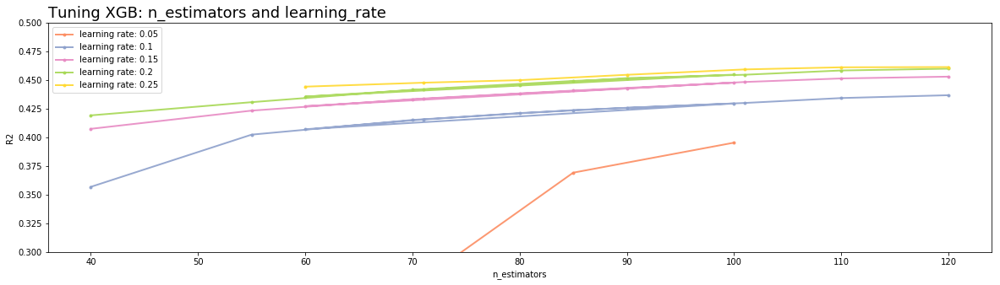

In [31]:
plot_R2_2params('n_estimators', 'learning_rate', xgb_tuning2[xgb_tuning2['num_features']==63])

In [15]:
## Testing XGBoost with params (RESULTS BELOW WITH CLIMZONES)

model = 'XGB'
## First choose: learning_rate, n_estimators
for learning_rate in [0.05, 0.1, 0.15, 0.2]:
    for n_estimators in [40,55,70,85,100]:
        print('Running XGBoost with params:')
        print(' -- Learning Rate = ' + str(learning_rate) +' -- n_estimators = ' + str(n_estimators) + '  -- ')
        
        regression = xgb.XGBRegressor(learning_rate = learning_rate,n_estimators = n_estimators)



        # Doing it will all features
        print('    with all features...')
        num_features = len(df.columns)-2
        Features = 'All w/ climzones'
        
        scores = do_regression(regression,df)

        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        
        R2_score = scores[0]
        MSE_score = scores[1]
        
        xgb_tuning = xgb_tuning.append({'Model': model,
                                        'num_features':len(df.columns)-1,'Features':'All w/ climzones',
                                        'learning_rate':learning_rate,'n_estimators':n_estimators,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)

        print('    ... done')

        # Iterate over ≠ numbers of features
        for num_features in range (5,6):

            print('    with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)

            x = df.drop(['calories_per_ha'], axis=1) ## TODO climate_zones encode One Hot Encoder
            y = df['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)

            X_RFE = selector.fit_transform(X,Y)

            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
            features_selected.append('calories_per_ha')
            scores = do_regression(regression,df[features_selected])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
            
            R2_score = scores[0]
            MSE_score = scores[1]
            xgb_tuning = xgb_tuning.append({'Model': model,
                                        'num_features':num_features,'Features':features_selected,
                                        'learning_rate':learning_rate,'n_estimators':n_estimators,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)
    
    
            print('    ... done \n')

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 40  -- 
    with all features...
    R2_score : -2.089662843804917
    MSE_score : -5.497891785362941
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : -2.1137687302130006
    MSE_score : -5.540515274035159
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 55  -- 
    with all features...
    R2_score : -0.15765197131771708
    MSE_score : -2.066127521164086
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : -0.17693431412043975
    MSE_score : -2.0999350521574263
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.2695568240841067
    MSE_score : -1.3084654633817094
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.24682794796441362
    MSE_score : -1.3480304976032282
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.3692546887871212
    MSE_score : -1.1321555945526434
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.32959599838890946
    MSE_score : -1.2019140554971757
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.39543406979017115
    MSE_score : -1.0860957148106405
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.37487769971103746
    MSE_score : -1.1220867679144997
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 40  -- 
    with all features...
    R2_score : 0.3568755734299513
    MSE_score : -1.1540865016318491
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.33138836313537007
    MSE_score : -1.1987909292009942
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 55  -- 
    with all features...
    R2_score : 0.4024393077849405
    MSE_score : -1.0736631189783818
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3684020838923766
    MSE_score : -1.1334497808516975
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.4152563784378427
    MSE_score : -1.0510276712586915
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3809575192703091
    MSE_score : -1.1116828912475083
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.42385247395888526
    MSE_score : -1.0355248404675959
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.39118833435287004
    MSE_score : -1.0934908153792842
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.42963066019295554
    MSE_score : -1.025111013372745
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.38952293352533374
    MSE_score : -1.0963676539068627
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 40  -- 
    with all features...
    R2_score : 0.40751395216220654
    MSE_score : -1.0647974257943162
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.37768991407704416
    MSE_score : -1.1169088395379188
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 55  -- 
    with all features...
    R2_score : 0.42339808903564274
    MSE_score : -1.03660639731994
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.37872615797946263
    MSE_score : -1.115428914797226
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.4334264115038796
    MSE_score : -1.018474930134619
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4245190117952139
    MSE_score : -1.0323065439422854
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.4408841688778784
    MSE_score : -1.0049009332531038
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.40569810371729104
    MSE_score : -1.0679044582509585
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.4478456729018415
    MSE_score : -0.992542895942463
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.41457665127855803
    MSE_score : -1.0492828135790908
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 40  -- 
    with all features...
    R2_score : 0.41925708016665186
    MSE_score : -1.0433175953261913
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.38768868857084987
    MSE_score : -1.0997533705864166
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 55  -- 
    with all features...
    R2_score : 0.43077126464876503
    MSE_score : -1.0227604605363927
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3969462517476524
    MSE_score : -1.0830791634372126
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.4416081987218883
    MSE_score : -1.003162141125355
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3956064139018287
    MSE_score : -1.0851938247561208
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.4493115637278061
    MSE_score : -0.9893101680908662
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4229844017831684
    MSE_score : -1.0361121567436804
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.4548195624605576
    MSE_score : -0.9791243117655654
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4292635093682267
    MSE_score : -1.024542445992736
    ... done 



In [21]:
## Testing XGBoost with params (RESULTS BELOW WITH CLIMZONES) (Same as above)

model = 'XGB'
## First choose: learning_rate, n_estimators
for learning_rate in [0.1, 0.15, 0.2,0.25]:
    for n_estimators in [60,71,80,90,101,110,120]:
        print('Running XGBoost with params:')
        print(' -- Learning Rate = ' + str(learning_rate) +' -- n_estimators = ' + str(n_estimators) + '  -- ')
        
        regression = xgb.XGBRegressor(learning_rate = learning_rate,n_estimators = n_estimators)



        # Doing it will all features
        print('    with all features...')
        num_features = len(df.columns)-2
        Features = 'All w/ climzones'
        
        scores = do_regression(regression,df)

        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        
        R2_score = scores[0]
        MSE_score = scores[1]
        
        xgb_tuning2 = xgb_tuning2.append({'Model': model,
                                        'num_features':len(df.columns)-1,'Features':'All w/ climzones',
                                        'learning_rate':learning_rate,'n_estimators':n_estimators,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)

        print('    ... done')

        # Iterate over ≠ numbers of features
        for num_features in range (5,6):

            print('    with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)

            x = df.drop(['calories_per_ha'], axis=1) ## TODO climate_zones encode One Hot Encoder
            y = df['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)

            X_RFE = selector.fit_transform(X,Y)

            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
            features_selected.append('calories_per_ha')
            scores = do_regression(regression,df[features_selected])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
            
            R2_score = scores[0]
            MSE_score = scores[1]
            xgb_tuning2 = xgb_tuning2.append({'Model': model,
                                        'num_features':num_features,'Features':features_selected,
                                        'learning_rate':learning_rate,'n_estimators':n_estimators,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)
    
    
            print('    ... done \n')

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 60  -- 
    with all features...
    R2_score : 0.40708732247447327
    MSE_score : -1.06537790771409
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.38879883315835057
    MSE_score : -1.0970218169403638
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 71  -- 
    with all features...
    R2_score : 0.41561154433024344
    MSE_score : -1.0504058484902052
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.38783847459227305
    MSE_score : -1.0984002813232188
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 80  -- 
    with all features...
    R2_score : 0.42125333191441355
    MSE_score : -1.040193863891528
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3930622487968773
    MSE_score : -1.0889968493221769
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 90  -- 
    with all features...
    R2_score : 0.4258992423166525
    MSE_score : -1.0317989604848197
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3817638774204258
    MSE_score : -1.110831820810618
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 101  -- 
    with all features...
    R2_score : 0.4300739899863812
    MSE_score : -1.0243021934133059
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4234771000905204
    MSE_score : -1.0361294355703323
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 110  -- 
    with all features...
    R2_score : 0.4343714608578056
    MSE_score : -1.0164809264442618
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.39495842015090116
    MSE_score : -1.0858167306474633
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 120  -- 
    with all features...
    R2_score : 0.43685169226754317
    MSE_score : -1.0121045292405633
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3849476074290399
    MSE_score : -1.1046214115256088
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 60  -- 
    with all features...
    R2_score : 0.42721788691034784
    MSE_score : -1.0299639660581248
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.38973064333934415
    MSE_score : -1.095277365235829
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 71  -- 
    with all features...
    R2_score : 0.4336406456891164
    MSE_score : -1.017978130514579
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3985025743148065
    MSE_score : -1.080707586452219
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 80  -- 
    with all features...
    R2_score : 0.4382003537776183
    MSE_score : -1.0097415823109113
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3923606363815205
    MSE_score : -1.0911578377707867
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 90  -- 
    with all features...
    R2_score : 0.4428063337771092
    MSE_score : -1.0015330364775326
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.40671920273976847
    MSE_score : -1.0653653687664635
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 101  -- 
    with all features...
    R2_score : 0.44839292362411315
    MSE_score : -0.9916105869093682
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.40890695577414854
    MSE_score : -1.0604964387434332
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 110  -- 
    with all features...
    R2_score : 0.4514801883731973
    MSE_score : -0.9859845279098826
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4119281320600262
    MSE_score : -1.055133823121589
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 120  -- 
    with all features...
    R2_score : 0.4530490224128723
    MSE_score : -0.9831599338012941
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4274562041803027
    MSE_score : -1.0262297594533656
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 60  -- 
    with all features...
    R2_score : 0.4356356831510776
    MSE_score : -1.0139897313689612
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3941409741109565
    MSE_score : -1.0885506918262142
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 71  -- 
    with all features...
    R2_score : 0.4418106113000217
    MSE_score : -1.0029035314692434
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.412816484932052
    MSE_score : -1.0542560153872862
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 80  -- 
    with all features...
    R2_score : 0.4458011520659218
    MSE_score : -0.9957604119254982
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4059902167842998
    MSE_score : -1.0675455140585328
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 90  -- 
    with all features...
    R2_score : 0.45179597189256004
    MSE_score : -0.984815594636807
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.41465993058646067
    MSE_score : -1.051725860068222
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 101  -- 
    with all features...
    R2_score : 0.45471655354047186
    MSE_score : -0.9792707610897992
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4174577578838181
    MSE_score : -1.0467476740889627
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 110  -- 
    with all features...
    R2_score : 0.458428350898288
    MSE_score : -0.9724061389634324
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4318686905628816
    MSE_score : -1.0195709447956283
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 120  -- 
    with all features...
    R2_score : 0.4600064459482165
    MSE_score : -0.9695387326119447
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4169121772936317
    MSE_score : -1.0481422190750367
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.25 -- n_estimators = 60  -- 
    with all features...
    R2_score : 0.4443164101374986
    MSE_score : -0.9982247728466784
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3993248389650063
    MSE_score : -1.0791271764291428
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.25 -- n_estimators = 71  -- 
    with all features...
    R2_score : 0.4477651977939131
    MSE_score : -0.9923899349948165
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.40375381190871673
    MSE_score : -1.071298761941471
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.25 -- n_estimators = 80  -- 
    with all features...
    R2_score : 0.44997684884447997
    MSE_score : -0.9883363067376291
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.41788460792500803
    MSE_score : -1.0462762827114869
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.25 -- n_estimators = 90  -- 
    with all features...
    R2_score : 0.45465792110801306
    MSE_score : -0.9798371113714881
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4171930881522017
    MSE_score : -1.0478729368428046
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.25 -- n_estimators = 101  -- 
    with all features...
    R2_score : 0.4593600054348079
    MSE_score : -0.9712112890591822
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4307827481363605
    MSE_score : -1.0203926106538521
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.25 -- n_estimators = 110  -- 
    with all features...
    R2_score : 0.461211483988634
    MSE_score : -0.9679798417424305
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4173150825690272
    MSE_score : -1.0445330211570125
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.25 -- n_estimators = 120  -- 
    with all features...
    R2_score : 0.46141050714819515
    MSE_score : -0.9676346741748298
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4218720297681037
    MSE_score : -1.036445598282548
    ... done 



### Grid Search

In [ ]:
xgb_regressor = xgb.XGBRegressor()

parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.03, .07, .2], #so called `eta` value
              'max_depth': [3, 5, 7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [0.5,0.75,1],
              'colsample_bytree': [0.5,0.75,1],
              'n_estimators': [300,500,600]}

parameters2 = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.01,.03,.05,.07], #so called `eta` value
              'max_depth': [5,6,7,8,9],
              'min_child_weight': [3,4,5],
              'silent': [1],
              'subsample': [0.5,0.75,1],
              'colsample_bytree': [0.65,0.75,0.85],
              'n_estimators': [300,500,600,700]}

parameters3 = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:linear'],
              'learning_rate': [.02,.03,.04], #so called `eta` value
              'max_depth': [7,8,9,10],
              'min_child_weight': [3,4,5],
              'silent': [1],
              'subsample': [0.65,0.75,0.85],
              'colsample_bytree': [0.55,0.65,0.75,0.85],
              'n_estimators': [300,500,600,700]}

xgb_grid = GridSearchCV(xgb_regressor,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True)

x = df.drop(['calories_per_ha'], axis=1)
y = df['calories_per_ha']

X_train, X_test, y_train, y_test = train_test_split(x, y)
xgb_grid.fit(X_train,
         y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)

Results with parameters

In [17]:
# Results from cell above
# Fitting 2 folds for each of 243 candidates, totalling 486 fits | elapsed: 16.0min finished
best_R2 = 0.44336470168217684
best_parameters = {'colsample_bytree': 0.75, 'learning_rate': 0.03, 'max_depth': 7,
                   'min_child_weight': 4, 'n_estimators': 600, 'nthread': 4,
                   'objective': 'reg:linear', 'silent': 1, 'subsample': 0.75}

Results with parameters2

In [ ]:
# Fitting 2 folds for each of 2160 candidates, totalling 4320 fits
best_R2 = 0.4545493615419044
best_parameters2 = {'colsample_bytree': 0.65, 'learning_rate': 0.03, 'max_depth': 9,
                    'min_child_weight': 3, 'n_estimators': 500, 'nthread': 4,
                    'objective': 'reg:linear','silent': 1, 'subsample': 0.75}

Results with paramaters3

In [ ]:
# Fitting 2 folds for each of 1728 candidates, totalling 3456 fits

best_R2 = 0.4842266625327576
best_parameters3 = {'colsample_bytree': 0.85, 'learning_rate': 0.02, 'max_depth': 10,
 'min_child_weight': 3, 'n_estimators': 700, 'nthread': 4,
 'objective': 'reg:linear', 'silent': 1, 'subsample': 0.85}

### Loop running XGB with ≠ features selected

In [34]:
model = 'XGB'
xgbreg = xgb.XGBRegressor(**best_parameters)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results_samedi = run_regressions_and_save_results(model, xgbreg, df, features_selection, results_samedi)
    
results_samedi.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug11.csv')    

    with all features...
    R2_score : 0.5383314065103078
    MSE_score : -0.8911791049913681
    with all features but climate zones...
    R2_score : 0.5425225664090898
    MSE_score : -0.8823549817658417
 RFE with 5 features ...
    R2_score : 0.5020644917016728
    MSE_score : -0.9626232003510395
 RFE with 6 features ...
    R2_score : 0.5152100902491907
    MSE_score : -0.9365509417452905
 RFE with 7 features ...
    R2_score : 0.5197312877053021
    MSE_score : -0.9277691263786322
 RFE with 8 features ...
    R2_score : 0.5165626517241458
    MSE_score : -0.9338119992014964
 RFE with 9 features ...
    R2_score : 0.5274898714016523
    MSE_score : -0.9116792882028235
 RFE with 10 features ...
    R2_score : 0.5212599979631302
    MSE_score : -0.9235068949448808
 RFE with 11 features ...
    R2_score : 0.5204404946910255
    MSE_score : -0.9256476747539828
 RFE with 12 features ...
    R2_score : 0.523796334171142
    MSE_score : -0.9199222732461239
 RFE with 13 features ...
    

In [40]:
model = 'XGB'
xgbreg = xgb.XGBRegressor(**best_parameters)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results_samedi = run_regressions_and_save_results(model, xgbreg, df, features_selection, results_samedi)
    
results_samedi.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug11.csv')    

    with all features...
    R2_score : 0.5383314065103078
    MSE_score : -0.8911791049913681
    with all features but climate zones...
    R2_score : 0.5425225664090898
    MSE_score : -0.8823549817658417
 RFE with 5 features ...
    R2_score : 0.5012850079775915
    MSE_score : -0.9622924583674808
 RFE with 6 features ...
    R2_score : 0.5094560855522768
    MSE_score : -0.949040320703524
 RFE with 7 features ...
    R2_score : 0.5197312877053021
    MSE_score : -0.9277691263786322
 RFE with 8 features ...
    R2_score : 0.5178069851471502
    MSE_score : -0.9306179957009851
 RFE with 9 features ...
    R2_score : 0.5159110172734284
    MSE_score : -0.9341408766865017
 RFE with 10 features ...
    R2_score : 0.5212599979631302
    MSE_score : -0.9235068949448808
 RFE with 11 features ...
    R2_score : 0.5289604526025944
    MSE_score : -0.9098350215832994
 RFE with 12 features ...
    R2_score : 0.523796334171142
    MSE_score : -0.9199222732461239
 RFE with 13 features ...
    R

In [36]:
# It is determinist yeah! 

    with all features...
    R2_score : 0.5383314065103078
    MSE_score : -0.8911791049913681
    with all features but climate zones...
    R2_score : 0.5425225664090898
    MSE_score : -0.8823549817658417
 RFE with 5 features ...
    R2_score : 0.5012850079775915
    MSE_score : -0.9622924583674808
 RFE with 6 features ...
    R2_score : 0.5152100902491907
    MSE_score : -0.9365509417452905
 RFE with 7 features ...
    R2_score : 0.5197312877053021
    MSE_score : -0.9277691263786322
 RFE with 8 features ...
    R2_score : 0.5165626517241458
    MSE_score : -0.9338119992014964
 RFE with 9 features ...
    R2_score : 0.5274898714016523
    MSE_score : -0.9116792882028235
 RFE with 10 features ...
    R2_score : 0.5212599979631302
    MSE_score : -0.9235068949448808
 RFE with 11 features ...
    R2_score : 0.524708432337956
    MSE_score : -0.9173454908865628
 RFE with 12 features ...
    R2_score : 0.523796334171142
    MSE_score : -0.9199222732461239
 RFE with 13 features ...
    R

In [36]:
model = 'XGB'
xgbreg = xgb.XGBRegressor(**best_parameters)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    results_samedi2 = run_regressions_and_save_results(model, xgbreg, df, features_selection, results_samedi2)
    
results_samedi2.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug11_2.csv')    

    with all features...
    R2_score : 0.5383314065103078
    MSE_score : -0.8911791049913681
    with all features but climate zones...
    R2_score : 0.5425225664090898
    MSE_score : -0.8823549817658417
 RFE with 5 features ...
    R2_score : 0.5012850079775915
    MSE_score : -0.9622924583674808
 RFE with 6 features ...
    R2_score : 0.5152100902491907
    MSE_score : -0.9365509417452905
 RFE with 7 features ...
    R2_score : 0.5197312877053021
    MSE_score : -0.9277691263786322
 RFE with 8 features ...
    R2_score : 0.5165626517241458
    MSE_score : -0.9338119992014964
 RFE with 9 features ...
    R2_score : 0.5274898714016523
    MSE_score : -0.9116792882028235
 RFE with 10 features ...
    R2_score : 0.5212599979631302
    MSE_score : -0.9235068949448808
 RFE with 11 features ...
    R2_score : 0.524708432337956
    MSE_score : -0.9173454908865628
 RFE with 12 features ...
    R2_score : 0.523796334171142
    MSE_score : -0.9199222732461239
 RFE with 13 features ...
    R

In [74]:
model = 'XGB'
xgbreg = xgb.XGBRegressor(**best_parameters)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    run_regressions_and_save_results(model, xgbreg, df, features_selection, Results_new)
    
    

    with all features...
    R2_score : 0.5406093006999909
    MSE_score : -0.8246271862214343
    with all features but climate zones...
    R2_score : 0.5426347506096731
    MSE_score : -0.8213419442826032
 RFE with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.48981662600214343
    MSE_score : -0.9163359946311189
 RFE with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.491343619855363
    MSE_score : -0.9134327101243915
 RFE with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4990281959567772
    MSE_score : -0.9007494152355721
 RFE with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5049807011304838
    MSE_score : -0.8896520950564435
 RFE with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5172744261126547
    MSE_score : -0.8677254936406079
 RFE with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5145086635828642
    MSE_score : -0.8720368474464752
 RFE with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5225965336818488
    MSE_score : -0.8576294121490278
 RFE with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5198069527552301
    MSE_score : -0.8623120513714276
 RFE with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5195331557301516
    MSE_score : -0.8629653474172049
 RFE with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5225481191873591
    MSE_score : -0.8576866964761365
 RFE with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5283220519787923
    MSE_score : -0.8474529889552528
 RFE with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5307536282854359
    MSE_score : -0.8434838383494799
 RFE with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5354639502422005
    MSE_score : -0.8348687590378099
 RFE with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5404614216538981
    MSE_score : -0.8254169963086092
 RFE with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5377971956788379
    MSE_score : -0.8304564670090702
RFE (no climzones) with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.48981662600214343
    MSE_score : -0.9163359946311189
RFE (no climzones) with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5074875158330682
    MSE_score : -0.8861045319282711
RFE (no climzones) with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5026750277547444
    MSE_score : -0.893907574012888
RFE (no climzones) with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5098685847001441
    MSE_score : -0.8809953472673442
RFE (no climzones) with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5209647749016258
    MSE_score : -0.8608394571711437
RFE (no climzones) with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5145086635828642
    MSE_score : -0.8720368474464752
RFE (no climzones) with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5117651424964539
    MSE_score : -0.8774404644984168
RFE (no climzones) with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5198069527552301
    MSE_score : -0.8623120513714276
RFE (no climzones) with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5195331557301516
    MSE_score : -0.8629653474172049
RFE (no climzones) with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5225481191873591
    MSE_score : -0.8576866964761365
RFE (no climzones) with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5319732677654488
    MSE_score : -0.840839383612748
RFE (no climzones) with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5307536282854359
    MSE_score : -0.8434838383494799
RFE (no climzones) with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5354639502422005
    MSE_score : -0.8348687590378099
RFE (no climzones) with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5352641646348377
    MSE_score : -0.8349858048728999
RFE (no climzones) with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5377971956788379
    MSE_score : -0.8304564670090702


In [78]:
model = 'XGB'
xgbreg = xgb.XGBRegressor(**best_parameters)

for features_selection in ['all', 'all_but_climzones', 'RFE', 'RFE_but_climzones']:    
    Results_new = run_regressions_and_save_results(model, xgbreg, df, features_selection, Results_new)
    
    

    with all features...
    R2_score : 0.5406093006999909
    MSE_score : -0.8246271862214343
    with all features but climate zones...
    R2_score : 0.5426347506096731
    MSE_score : -0.8213419442826032
 RFE with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4919951107973576
    MSE_score : -0.912592181656876
 RFE with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5044769722553704
    MSE_score : -0.890035616976584
 RFE with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4990281959567772
    MSE_score : -0.9007494152355721
 RFE with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5049807011304838
    MSE_score : -0.8896520950564435
 RFE with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5209647749016258
    MSE_score : -0.8608394571711437
 RFE with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5055289818523075
    MSE_score : -0.8886219436267879
 RFE with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5117651424964539
    MSE_score : -0.8774404644984168
 RFE with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5198069527552301
    MSE_score : -0.8623120513714276
 RFE with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5280350981371749
    MSE_score : -0.8480219127742865
 RFE with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.527608609244785
    MSE_score : -0.848399106427407
 RFE with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5283220519787923
    MSE_score : -0.8474529889552528
 RFE with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5307536282854359
    MSE_score : -0.8434838383494799
 RFE with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5354639502422005
    MSE_score : -0.8348687590378099
 RFE with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5352641646348377
    MSE_score : -0.8349858048728999
 RFE with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5377971956788379
    MSE_score : -0.8304564670090702
RFE (no climzones) with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5027302442845459
    MSE_score : -0.8936750622578818
RFE (no climzones) with 6 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5074875158330682
    MSE_score : -0.8861045319282711
RFE (no climzones) with 7 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5011930084214222
    MSE_score : -0.895754343412938
RFE (no climzones) with 8 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5025566548847991
    MSE_score : -0.8937861741599988
RFE (no climzones) with 9 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5209647749016258
    MSE_score : -0.8608394571711437
RFE (no climzones) with 10 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5171782505566348
    MSE_score : -0.8673227970495132
RFE (no climzones) with 11 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5225965336818488
    MSE_score : -0.8576294121490278
RFE (no climzones) with 12 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5198069527552301
    MSE_score : -0.8623120513714276
RFE (no climzones) with 13 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5195331557301516
    MSE_score : -0.8629653474172049
RFE (no climzones) with 14 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.527608609244785
    MSE_score : -0.848399106427407
RFE (no climzones) with 15 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5181021424462724
    MSE_score : -0.8655500782861028
RFE (no climzones) with 16 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5307536282854359
    MSE_score : -0.8434838383494799
RFE (no climzones) with 17 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5354639502422005
    MSE_score : -0.8348687590378099
RFE (no climzones) with 18 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5352641646348377
    MSE_score : -0.8349858048728999
RFE (no climzones) with 19 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.5377971956788379
    MSE_score : -0.8304564670090702


In [26]:


def run_regressions_and_save_results(model, regression, dataframe, features_selection, results_df):
    '''features_selection = 'all', 'all_but_climzones', 'RFE', 'RFE_but_climzones   '''

    # - - - - - - - - - - - - - - 
    # Features = All
    # - - - - - - - - - - - - - - 
    
    if features_selection == 'all':
        print('    with all features...')
        Features = 'All w/ climzones'
        
        scores = do_regression(regression,dataframe)
        
        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        R2_score = scores[0]
        MSE_score = scores[1]
        results_df = results_df.append({'Model': model,
                                        'num_features':len(dataframe.columns)-1,'Features':Features,
                                        'colsample_bytree': 0.75,'max_depth': 7,
                                          'min_child_weight': 4, 'n_estimators': 600, 'nthread': 4,
                                          'objective': 'reg:linear', 'silent': 1, 'subsample': 0.75,
                                        'learning_rate':0.03,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)
        
        
    # - - - - - - - - - - - - - - -
    # Features = All but climzones
    # - - - - - - - - - - - - - - -
    
    elif features_selection == 'all_but_climzones':
        dataframe = dataframe[columns_without_climatezones]
        
        print('    with all features but climate zones...')
        Features = 'All w/o climzones'
        
        scores = do_regression(regression,dataframe)
        
        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        R2_score = scores[0]
        MSE_score = scores[1]
        results_df = results_df.append({'Model': model,
                                        'num_features':len(dataframe.columns)-1,'Features':Features,
                                        'colsample_bytree': 0.75,'max_depth': 7,
                                      'min_child_weight': 4, 'n_estimators': 600, 'nthread': 4,
                                      'objective': 'reg:linear', 'silent': 1, 'subsample': 0.75,
                                    'learning_rate':0.03,
                                    'R2':R2_score,'MSE':MSE_score},ignore_index=True)
           
    
    # - - - - - - - - - - - - - - -
    # Features = SUBSET
    # - - - - - - - - - - - - - - -
    
    # if features_selection = 'subset':
    ## TODO
    
    
    # - - - - - - - - - - - - - - - - - - - - - - -
    # Features = RFE selected (with climate zones)
    # - - - - - - - - - - - - - - - - - - - - - - -
    
    elif features_selection == 'RFE':
        for num_features in range (5,30):

            print(' RFE with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)
            x = dataframe.drop(['calories_per_ha'], axis=1) 
            y = dataframe['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)
            X_RFE = selector.fit_transform(X,Y)
            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
            
            # Do regression and append results to results_df
            scores = do_regression(regression,dataframe[(features_selected + ['calories_per_ha'])])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
            R2_score = scores[0]
            MSE_score = scores[1]
            results_df = results_df.append({'Model': model,
                                    'num_features':num_features,'Features':features_selected,
                                    'colsample_bytree': 0.75,'max_depth': 7,
                                      'min_child_weight': 4, 'n_estimators': 600, 'nthread': 4,
                                      'objective': 'reg:linear', 'silent': 1, 'subsample': 0.75,
                                    'learning_rate':0.03,
                                    'R2':R2_score,'MSE':MSE_score},ignore_index=True)
        
        
    # - - - - - - - - - - - - - - - - - - - - - - 
    # Features = RFE selected (w/o climate zones)
    # - - - - - - - - - - - - - - - - - - - - - - 
    
    elif features_selection == 'RFE_but_climzones':
        
        dataframe = dataframe[columns_without_climatezones]
        
        for num_features in range (5,30):

            print('RFE (no climzones) with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)
            x = dataframe.drop(['calories_per_ha'], axis=1) 
            y = dataframe['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)
            X_RFE = selector.fit_transform(X,Y)
            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
   
            # Do regression and append results to results_df
            scores = do_regression(regression,dataframe[(features_selected + ['calories_per_ha'])])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
            R2_score = scores[0]
            MSE_score = scores[1]
            results_df = results_df.append({'Model': model,
                                    'num_features':num_features,'Features':features_selected,
                                    'colsample_bytree': 0.75,'max_depth': 7,
                                      'min_child_weight': 4, 'n_estimators': 600, 'nthread': 4,
                                      'objective': 'reg:linear', 'silent': 1, 'subsample': 0.75,
                                    'learning_rate':0.03,
                                    'R2':R2_score,'MSE':MSE_score},ignore_index=True)
    
        
    return(results_df)

# Features importances

In [128]:
xgbreg



XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.75, gamma=0, learning_rate=0.03,
       max_delta_step=0, max_depth=7, min_child_weight=4, missing=None,
       n_estimators=600, n_jobs=1, nthread=4, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=1, subsample=0.75)

In [101]:
print(xgbreg.feature_importances_)


['gdp_per_capita', 'temp_avg', 'temp_seasonality', 'pixel_id_float', 'lat']

In [ ]:
regression = xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.75, gamma=0, learning_rate=0.03,
       max_delta_step=0, max_depth=7, min_child_weight=4, missing=None,
       n_estimators=600, n_jobs=1, nthread=4, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=1, subsample=0.75)
dataframe = df

x = dataframe.drop(['calories_per_ha'], axis=1)
y = dataframe['calories_per_ha']
X_train, X_test, y_train, y_test = train_test_split(x, y)
regression.fit(X_train, y_train)
print(regression.feature_importances_)

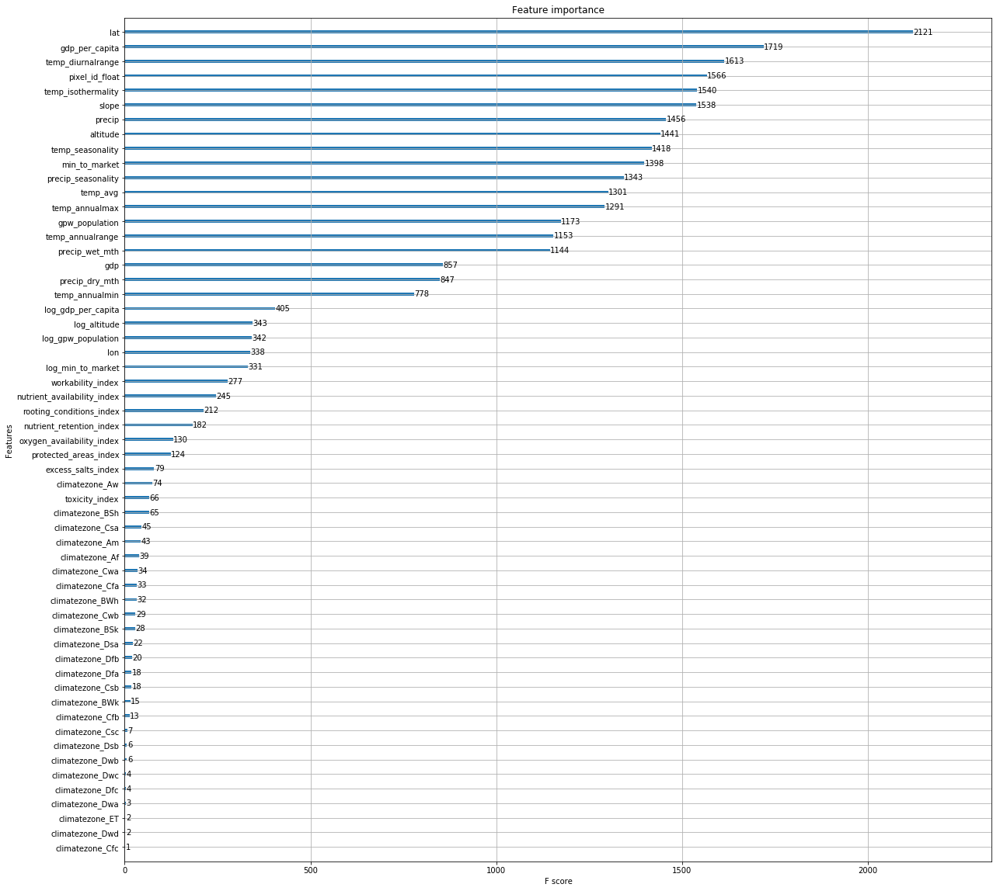

In [163]:
fig,ax = plt.subplots(figsize=(20,20))
ax = xgb.plot_importance(regression, ax=ax)

In [1]:
#Plot
fig,ax = plt.subplots(figsize=(20,20))
ax = xgb.plot_importance(regression, ax=ax)


NameError: name 'plt' is not defined

## Viz

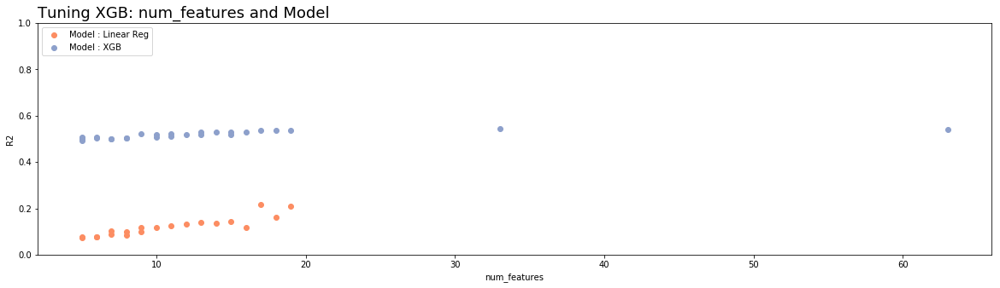

In [160]:
results_linear_1 =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_0    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv')
results_xgb_1    =  pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug9.csv')
                 
results_all = pd.concat([results_linear_1,results_xgb_1])                 
                 
plot_R2_2params('num_features','Model',results_all, scatter=True,ylim=(0,1))

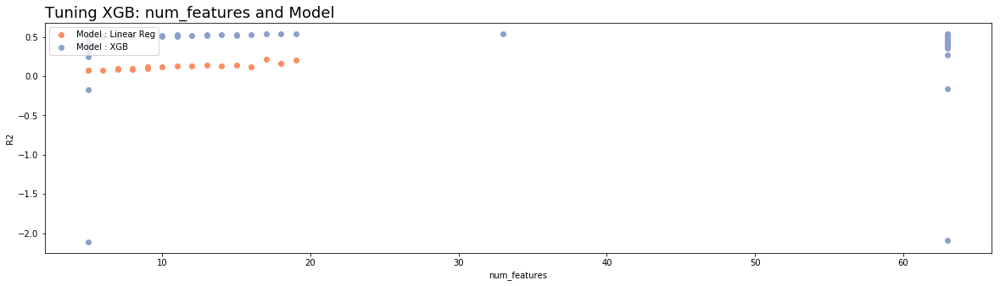

In [151]:
results_linear_1 = pd.read_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')
results_xgb_0 = ('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug8.csv)
results_xgb_1 = ('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug9.csv)
                 
results_all = pd.concat([results_linear_1,results_xgb_1])                 
                 
plot_R2_2params('num_features','Model',results_all, scatter=True)


In [149]:
merged_all = pd.concat([results,Results_new])



In [111]:
def plot_R2_2params(param_x, param_color, xgb_tuning,scatter=False,ylim=None):

    fig, ax = plt.subplots(figsize=(20,5))


    palette = plt.get_cmap('Set2')
    num=0
    for param_color_value in xgb_tuning[param_color].unique():
        num+=1
        x = (xgb_tuning[xgb_tuning[param_color]==param_color_value][param_x])
        y = (xgb_tuning[xgb_tuning[param_color]==param_color_value]['R2'])
        #labels= (xgb_tuning[xgb_tuning[param_color]==learning_rate][param_color])
        if scatter == False:
            P = plt.plot(x,y, marker='.',color=palette(num), linewidth=2, alpha=0.9,
                 label=(str(param_color)+' : ' +str(param_color_value)))
        if scatter == True:
            P = plt.scatter(x,y, marker='o',color=palette(num),
                 label=(str(param_color)+' : ' +str(param_color_value)))
        
    plt.legend(loc=2, ncol=1)
    plt.title(("Comparing models by "+ param_x +" and "+param_color), loc='left', fontsize=18, fontweight=0, color='black')

    plt.xlabel(param_x)
    plt.ylabel("R2")
    
    # Y lim
    if ylim != None:
        if scatter == False:
            P[0].axes.set_ylim(ylim)
        if scatter == True:
            P.axes.set_ylim(ylim)

## Save intermediary results

In [159]:
Results_new.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug9.csv')

In [61]:
results_aug8 = pd.concat([results_aug8, xgb_tuning3])
results_aug8 = results_aug8.drop_duplicates(subset=['R2','model','num_features'])

results_aug8.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_aug8.csv')

results_aug8.shape

results_aug8.sort_values('R2',ascending=False) ## Faux: line 98 =5 features from RFE, line 97 = 6


(118, 14)

In [152]:
results.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/results_linear_1.csv')


In [ ]:
Results_new = pd.concat([Results_new, xgb_tuning3])
Results_new = Results_new.drop_duplicates(subset=['R2','model','num_features'])

Results_new.to_csv('../ipbes_invest_crop_yield_project/intermediate/create_results_table/Results_xgbAug9.csv')

Results_new.shape

Results_new.sort_values('R2',ascending=False).head(15) ## Faux: line 98 =5 features from RFE, line 97 = 6


# À ranger

In [15]:
## Testing XGBoost with params (RESULTS BELOW WITH CLIMZONES)

model = 'XGB'
## Step 2: tuning tree-based parameters

learning_rate = 0.2:
n_estimators = 100:
    
    for min_samples_split in [500 ... ### ~0.5-1% of total values
           for max_depth in range (5,9):                   
                              
                              
        print('Running XGBoost with params:')
        print(' -- Learning Rate = ' + str(learning_rate) +' -- n_estimators = ' + str(n_estimators) + '  -- ')
        
        regression = xgb.XGBRegressor(learning_rate = learning_rate,n_estimators = n_estimators)



        # Doing it will all features
        print('    with all features...')
        num_features = len(df.columns)-2
        Features = 'All w/ climzones'
        
        scores = do_regression(regression,df)

        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        
        R2_score = scores[0]
        MSE_score = scores[1]
        
        xgb_tuning = xgb_tuning.append({'Model': model,
                                        'num_features':len(df.columns)-1,'Features':'All w/ climzones',
                                        'learning_rate':learning_rate,'n_estimators':n_estimators,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)

        print('    ... done')

        # Iterate over ≠ numbers of features
        for num_features in range (5,6):

            print('    with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)

            x = df.drop(['calories_per_ha'], axis=1) ## TODO climate_zones encode One Hot Encoder
            y = df['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)

            X_RFE = selector.fit_transform(X,Y)

            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
            features_selected.append('calories_per_ha')
            scores = do_regression(regression,df[features_selected])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
            
            R2_score = scores[0]
            MSE_score = scores[1]
            xgb_tuning = xgb_tuning.append({'Model': model,
                                        'num_features':num_features,'Features':features_selected,
                                        'learning_rate':learning_rate,'n_estimators':n_estimators,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)
    
    
            print('    ... done \n')

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 40  -- 
    with all features...
    R2_score : -2.089662843804917
    MSE_score : -5.497891785362941
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : -2.1137687302130006
    MSE_score : -5.540515274035159
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 55  -- 
    with all features...
    R2_score : -0.15765197131771708
    MSE_score : -2.066127521164086
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : -0.17693431412043975
    MSE_score : -2.0999350521574263
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.2695568240841067
    MSE_score : -1.3084654633817094
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.24682794796441362
    MSE_score : -1.3480304976032282
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.3692546887871212
    MSE_score : -1.1321555945526434
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.32959599838890946
    MSE_score : -1.2019140554971757
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.39543406979017115
    MSE_score : -1.0860957148106405
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.37487769971103746
    MSE_score : -1.1220867679144997
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 40  -- 
    with all features...
    R2_score : 0.3568755734299513
    MSE_score : -1.1540865016318491
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.33138836313537007
    MSE_score : -1.1987909292009942
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 55  -- 
    with all features...
    R2_score : 0.4024393077849405
    MSE_score : -1.0736631189783818
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3684020838923766
    MSE_score : -1.1334497808516975
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.4152563784378427
    MSE_score : -1.0510276712586915
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3809575192703091
    MSE_score : -1.1116828912475083
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.42385247395888526
    MSE_score : -1.0355248404675959
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.39118833435287004
    MSE_score : -1.0934908153792842
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.42963066019295554
    MSE_score : -1.025111013372745
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.38952293352533374
    MSE_score : -1.0963676539068627
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 40  -- 
    with all features...
    R2_score : 0.40751395216220654
    MSE_score : -1.0647974257943162
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.37768991407704416
    MSE_score : -1.1169088395379188
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 55  -- 
    with all features...
    R2_score : 0.42339808903564274
    MSE_score : -1.03660639731994
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.37872615797946263
    MSE_score : -1.115428914797226
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.4334264115038796
    MSE_score : -1.018474930134619
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4245190117952139
    MSE_score : -1.0323065439422854
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.4408841688778784
    MSE_score : -1.0049009332531038
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.40569810371729104
    MSE_score : -1.0679044582509585
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.4478456729018415
    MSE_score : -0.992542895942463
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.41457665127855803
    MSE_score : -1.0492828135790908
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 40  -- 
    with all features...
    R2_score : 0.41925708016665186
    MSE_score : -1.0433175953261913
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.38768868857084987
    MSE_score : -1.0997533705864166
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 55  -- 
    with all features...
    R2_score : 0.43077126464876503
    MSE_score : -1.0227604605363927
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3969462517476524
    MSE_score : -1.0830791634372126
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 70  -- 
    with all features...
    R2_score : 0.4416081987218883
    MSE_score : -1.003162141125355
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.3956064139018287
    MSE_score : -1.0851938247561208
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 85  -- 
    with all features...
    R2_score : 0.4493115637278061
    MSE_score : -0.9893101680908662
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4229844017831684
    MSE_score : -1.0361121567436804
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2 -- n_estimators = 100  -- 
    with all features...
    R2_score : 0.4548195624605576
    MSE_score : -0.9791243117655654
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


    R2_score : 0.4292635093682267
    MSE_score : -1.024542445992736
    ... done 



In [205]:
## Testing XGBoost with params -- RESULTS BELOW W/O CLIMATE ZONES

model = 'XGB'
## First choose: learning_rate, n_estimators
for learning_rate in [0.05, 0.1, 0.15, 0.2]:
    for n_estimators in [40,55,70,85,100]:
        print('Running XGBoost with params:')
        print(' -- Learning Rate = ' + str(learning_rate) +' -- n_estimators = ' + str(n_estimators) + '  -- ')
        
        regression = xgb.XGBRegressor(learning_rate = learning_rate,n_estimators = n_estimators)



        # Doing it will all features
        print('    with all features...')
        num_features = len(df.columns)-2
        Features = 'All EXCEPT climzones'
        
        scores = do_regression(regression,df.drop(['climate_zones'], axis=1))

        print('    R2_score : '+str(scores[0]))
        print('    MSE_score : '+str(scores[1]))
        
        R2_score = scores[0]
        MSE_score = scores[1]
        
        xgb_tuning = xgb_tuning.append({'Model': model,
                                        'num_features':num_features,'Features':features_selected,
                                        'learning_rate':learning_rate,'n_estimators':n_estimators,
                                        'R2':R2_score,'MSE':MSE_score},ignore_index=True)

        print('    ... done')

        # Iterate over ≠ numbers of features
        for num_features in range (5,6):

            print('    with '+str(num_features)+ ' features ...')

            ## RFE - Features selection
            selector = RFE(regression, num_features, step=1)

            x = df.drop(['calories_per_ha','climate_zones'], axis=1) ## TODO climate_zones encode One Hot Encoder
            y = df['calories_per_ha']
            X, X_test, Y, Y_test = train_test_split(x, y)

            X_RFE = selector.fit_transform(X,Y)

            features_selected = [X.columns[feature_pos] for feature_pos in selector.get_support(indices=True)]
            features_selected.append('calories_per_ha')
            scores = do_regression(regression,df[features_selected])
            print('    R2_score : '+str(scores[0]))
            print('    MSE_score : '+str(scores[1]))
    
    
            print('    ... done \n')

Running XGBoost with params:
 -- Learning Rate = 0.05      -- n_estimators = 40  -- 
    with all features...
R2_score : -2.0532010678759955
MSE_score : -5.538779158384349
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : -2.062889586949815
MSE_score : -5.557887544404986
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05      -- n_estimators = 55  -- 
    with all features...
R2_score : -0.16055914011633768
MSE_score : -2.11514207387677
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : -0.17510470189948146
MSE_score : -2.142804533705525
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05      -- n_estimators = 70  -- 
    with all features...
R2_score : 0.2568721021318591
MSE_score : -1.3613612548597505
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.24465703273188613
MSE_score : -1.3846076017640911
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05      -- n_estimators = 85  -- 
    with all features...
R2_score : 0.3551451106829767
MSE_score : -1.1840800173783423
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.340300758444985
MSE_score : -1.2126132646480254
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.05      -- n_estimators = 100  -- 
    with all features...
R2_score : 0.3828339739518645
MSE_score : -1.1344433797026887
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.38318223194270556
MSE_score : -1.1346428159359627
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1      -- n_estimators = 40  -- 
    with all features...
R2_score : 0.3463516680733554
MSE_score : -1.1994597007191075
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.3453004373734923
MSE_score : -1.202797215153806
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1      -- n_estimators = 55  -- 
    with all features...
R2_score : 0.39532669392455183
MSE_score : -1.1114288570205484
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.3918343490612521
MSE_score : -1.118887024273955
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1      -- n_estimators = 70  -- 
    with all features...
R2_score : 0.41024265446379743
MSE_score : -1.0842512002993492
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.4057785941786925
MSE_score : -1.0932343404332419
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1      -- n_estimators = 85  -- 
    with all features...
R2_score : 0.4204730811674449
MSE_score : -1.0654301705780096
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.38388666942146155
MSE_score : -1.1334035499676571
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.1      -- n_estimators = 100  -- 
    with all features...
R2_score : 0.4265861120262967
MSE_score : -1.0538964616918975
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.38054955269149404
MSE_score : -1.1383899994725417
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15      -- n_estimators = 40  -- 
    with all features...
R2_score : 0.39846623194483266
MSE_score : -1.1061102390943447
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.3854607453131912
MSE_score : -1.1310923408639488
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15      -- n_estimators = 55  -- 
    with all features...
R2_score : 0.4154575483035595
MSE_score : -1.07463043110042
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.41310179920609924
MSE_score : -1.0800546155691264
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15      -- n_estimators = 70  -- 
    with all features...
R2_score : 0.424505715740767
MSE_score : -1.0577984761219212
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.4017216180416604
MSE_score : -1.1004231222624874
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15      -- n_estimators = 85  -- 
    with all features...
R2_score : 0.4321958678789656
MSE_score : -1.0432812519850299
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.38575156556293444
MSE_score : -1.1281003735463613
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.15      -- n_estimators = 100  -- 
    with all features...
R2_score : 0.44000221969744546
MSE_score : -1.0289767715393634
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.40599996233563795
MSE_score : -1.0923351319583383
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2      -- n_estimators = 40  -- 
    with all features...
R2_score : 0.4148022864868933
MSE_score : -1.0752565464183126
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.4203652862447863
MSE_score : -1.0664630656924234
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2      -- n_estimators = 55  -- 
    with all features...
R2_score : 0.4268735708040213
MSE_score : -1.0528041674047812
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.38082059970216237
MSE_score : -1.1369797256065186
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2      -- n_estimators = 70  -- 
    with all features...
R2_score : 0.43946401597495266
MSE_score : -1.0291915563456207
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.39950378901551514
MSE_score : -1.103668666475499
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2      -- n_estimators = 85  -- 
    with all features...
R2_score : 0.44519683045001096
MSE_score : -1.018385333734493
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.3972179349533541
MSE_score : -1.1065808700047857
    ... done 

Running XGBoost with params:
 -- Learning Rate = 0.2      -- n_estimators = 100  -- 
    with all features...
R2_score : 0.4517768133687852
MSE_score : -1.0055883137860309
    ... done
    with 5 features ...


/Users/charlotteweil1/anaconda/envs/spatialenv/lib/python3.6/site-packages/sklearn/utils/__init__.py:93: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(mask.dtype, np.int):


R2_score : 0.4084606552649526
MSE_score : -1.0864325330303806
    ... done 



In [ ]:
(max_depth=3, learning_rate=0.1, n_estimators=100, silent=True, objective='reg:linear', booster='gbtree', n_jobs=1, nthread=None, gamma=0, min_child_weight=1, max_delta_step=0, subsample=1, colsample_bytree=1, colsample_bylevel=1, reg_alpha=0, reg_lambda=1, scale_pos_weight=1, base_score=0.5, random_state=0, seed=None, missing=None

In [ ]:
## First choose: learning_rate, n_estimators
for learning_rate in [0.05, 0.1, 0.15, 0.2]:
    for n_estimators in [40,55,70,85,100]:
        print(' -- Learning Rate = ' + str(learning_rate) + '      -- n_estimators = ' + str(n_estimators) + '  -- ')
        
        regression = xgb.XGBRegressor(learning_rate = learning_rate,n_estimators = n_estimators)


## (Looking at predicted values)

In [ ]:
dataframe = dfLog

x = dataframe.drop(['calories_per_ha'], axis=1)
y = dataframe['calories_per_ha']
X_train, X_test, y_train, y_test = train_test_split(x, y)

lr = LinearRegression().fit(X_train, y_train)
y_predicted = lr.predict(X_test)

In [ ]:
compare = pd.DataFrame()
compare['y_test'] = y_test
compare['predicted'] = y_predicted 

#Bunch of negative values
compare

In [ ]:
ax = compare.plot.scatter(x='y_test',y='predicted',s=0.5)
ax.plot(ax.get_xlim(), ax.get_xlim(), ls="--", c=".3")

# Old:  Reproduce Justin's Full reg
*  d$precip_2 <- d$precip ^ 2
            d$precip_3 <- d$precip ^ 3
            d$temperature_2 <- d$temperature ^ 2
            d$temperature_3 <- d$temperature ^ 3
            d$minutes_to_market_2 <- d$minutes_to_market ^ 2
            d$minutes_to_market_3 <- d$minutes_to_market ^ 3
            d$gdp_gecon_2 <- d$gdp_gecon ^ 2
            d$gdp_gecon_3 <- d$gdp_gecon ^ 3
            d$altitude_2 <- d$altitude ^ 2
            d$altitude_3 <- d$altitude ^ 3
            d$slope_2 <- d$slope ^ 2
            d$slope_3 <- d$slope ^ 3
            d$crop_suitability_2 <- d$crop_suitability ^ 2
            d$crop_suitability_3 <- d$crop_suitability ^ 3

In [ ]:
dfFull = pd.DataFrame.copy(dfLog)

#for var in ['precip','temperature','minutes_to_market','gdp_gecon','altitude','slope']:#,'crop_suitability']:
for var in ['bio12','bio1','minutes_to_market_5m','gdp_per_capita_2000_5m','altitude','slope']:#,'crop_suitability']:
    for i in range(2,4):
        dfFull[var+str(i)] = dfFull[var].pow(i)

In [ ]:
#for var in ['precip','temperature','minutes_to_market','gdp_gecon','altitude','slope']:#,'crop_suitability']:
for var in ['bio12','bio1','minutes_to_market_5m','gdp_per_capita_2000_5m','altitude','slope']:#,'crop_suitability']:
    for i in range(2,4):
        dfFull[var+str(i)] = dfFull[var].pow(i)

In [ ]:
dfFull.columns

In [ ]:
linreg(dfFull[['calories_per_ha', 'bio12', 'bio1', 'slope', 'altitude',
       'workability_index', 'toxicity_index', 'rooting_conditions_index',
       'oxygen_availability_index', 'nutrient_retention_index',
       'nutrient_availability_index', 'excess_salts_index', 'gdp_2000',
       'gdp_per_capita_2000_5m', 'minutes_to_market_5m','has_ag',
       'bio13', 'bio122', 'bio123', 'minutes_to_market_5m2',
       'minutes_to_market_5m3', 'gdp_per_capita_2000_5m2',
       'gdp_per_capita_2000_5m3', 'altitude2', 'altitude3', 'slope2',
       'slope3']]) 

In [ ]:
linreg(dfFull) # Without climate zones

# Old: Tobit (censored regression)

## from https://github.com/jamesdj/tobit/blob/master/tobit.ipynb

from tobit import * --> Learn how to put the next cell tobit.py as a package??

In [ ]:
import math
import warnings

import numpy as np
import pandas as pd
from scipy.optimize import minimize
import scipy.stats
from scipy.special import log_ndtr
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error


def split_left_right_censored(x, y, cens):
    counts = cens.value_counts()
    if -1 not in counts and 1 not in counts:
        warnings.warn("No censored observations; use regression methods for uncensored data")
    xs = []
    ys = []

    for value in [-1, 0, 1]:
        if value in counts:
            split = cens == value
            y_split = np.squeeze(y[split].values)
            x_split = x[split].values

        else:
            y_split, x_split = None, None
        xs.append(x_split)
        ys.append(y_split)
    return xs, ys


def tobit_neg_log_likelihood(xs, ys, params):
    x_left, x_mid, x_right = xs
    y_left, y_mid, y_right = ys

    b = params[:-1]
    # s = math.exp(params[-1])
    s = params[-1]

    to_cat = []

    cens = False
    if y_left is not None:
        cens = True
        left = (y_left - np.dot(x_left, b))
        to_cat.append(left)
    if y_right is not None:
        cens = True
        right = (np.dot(x_right, b) - y_right)
        to_cat.append(right)
    if cens:
        concat_stats = np.concatenate(to_cat, axis=0) / s
        log_cum_norm = scipy.stats.norm.logcdf(concat_stats)  # log_ndtr(concat_stats)
        cens_sum = log_cum_norm.sum()
    else:
        cens_sum = 0

    if y_mid is not None:
        mid_stats = (y_mid - np.dot(x_mid, b)) / s
        mid = scipy.stats.norm.logpdf(mid_stats) - math.log(max(np.finfo('float').resolution, s))
        mid_sum = mid.sum()
    else:
        mid_sum = 0

    loglik = cens_sum + mid_sum

    return - loglik


def tobit_neg_log_likelihood_der(xs, ys, params):
    x_left, x_mid, x_right = xs
    y_left, y_mid, y_right = ys

    b = params[:-1]
    # s = math.exp(params[-1]) # in censReg, not using chain rule as below; they optimize in terms of log(s)
    s = params[-1]

    beta_jac = np.zeros(len(b))
    sigma_jac = 0

    if y_left is not None:
        left_stats = (y_left - np.dot(x_left, b)) / s
        l_pdf = scipy.stats.norm.logpdf(left_stats)
        l_cdf = log_ndtr(left_stats)
        left_frac = np.exp(l_pdf - l_cdf)
        beta_left = np.dot(left_frac, x_left / s)
        beta_jac -= beta_left

        left_sigma = np.dot(left_frac, left_stats)
        sigma_jac -= left_sigma

    if y_right is not None:
        right_stats = (np.dot(x_right, b) - y_right) / s
        r_pdf = scipy.stats.norm.logpdf(right_stats)
        r_cdf = log_ndtr(right_stats)
        right_frac = np.exp(r_pdf - r_cdf)
        beta_right = np.dot(right_frac, x_right / s)
        beta_jac += beta_right

        right_sigma = np.dot(right_frac, right_stats)
        sigma_jac -= right_sigma

    if y_mid is not None:
        mid_stats = (y_mid - np.dot(x_mid, b)) / s
        beta_mid = np.dot(mid_stats, x_mid / s)
        beta_jac += beta_mid

        mid_sigma = (np.square(mid_stats) - 1).sum()
        sigma_jac += mid_sigma

    combo_jac = np.append(beta_jac, sigma_jac / s)  # by chain rule, since the expression above is dloglik/dlogsigma

    return -combo_jac


class TobitModel:
    def __init__(self, fit_intercept=True):
        self.fit_intercept = fit_intercept
        self.ols_coef_ = None
        self.ols_intercept = None
        self.coef_ = None
        self.intercept_ = None
        self.sigma_ = None

    def fit(self, x, y, cens, verbose=False):
        """
        Fit a maximum-likelihood Tobit regression
        :param x: Pandas DataFrame (n_samples, n_features): Data
        :param y: Pandas Series (n_samples,): Target
        :param cens: Pandas Series (n_samples,): -1 indicates left-censored samples, 0 for uncensored, 1 for right-censored
        :param verbose: boolean, show info from minimization
        :return:
        """
        x_copy = x.copy()
        if self.fit_intercept:
            x_copy.insert(0, 'intercept', 1.0)
        else:
            x_copy.scale(with_mean=True, with_std=False, copy=False)
        init_reg = LinearRegression(fit_intercept=False).fit(x_copy, y)
        b0 = init_reg.coef_
        y_pred = init_reg.predict(x_copy)
        resid = y - y_pred
        resid_var = np.var(resid)
        s0 = np.sqrt(resid_var)
        params0 = np.append(b0, s0)
        xs, ys = split_left_right_censored(x_copy, y, cens)

        result = minimize(lambda params: tobit_neg_log_likelihood(xs, ys, params), params0, method='BFGS',
                          jac=lambda params: tobit_neg_log_likelihood_der(xs, ys, params), options={'disp': verbose})
        if verbose:
            print(result)
        self.ols_coef_ = b0[1:]
        self.ols_intercept = b0[0]
        if self.fit_intercept:
            self.intercept_ = result.x[1]
            self.coef_ = result.x[1:-1]
        else:
            self.coef_ = result.x[:-1]
            self.intercept_ = 0
        self.sigma_ = result.x[-1]
        return self

    def predict(self, x):
        return self.intercept_ + np.dot(x, self.coef_)

    def score(self, x, y, scoring_function=mean_absolute_error):
        y_pred = np.dot(x, self.coef_)
        return scoring_function(y, y_pred)

In [ ]:
dataframe = dfLog

x = dataframe.drop(['calories_per_cell','climate_zone'], axis=1)
y = dataframe['calories_per_cell']
X_train, X_test, y_train, y_test = train_test_split(x, y)

##Unsure about this 'cens' part
cens = pd.Series(np.zeros((len(y_train),)))
cens[left] = -1
cens[right] = 1
##See below

tob = TobitModel().fit(X_train, y_train,cens)
y_predicted = tob.predict(X_test)

In [ ]:
compare = pd.DataFrame()
compare['y_test'] = y_test
compare['predicted'] = y_predicted 

#Bunch of negative values

In [ ]:
## WTF? : below

In [ ]:
(len(y))

In [ ]:
cens = pd.Series(np.zeros((20,)))

In [ ]:
cens[left] = -1
cens[right] = 1

In [ ]:
cens

## from 